In [1]:
import pandas as pd

In [4]:
#mc = pd.read_csv('../data/halpha_emitters-gustabin/MC.csv')
splus_gal = pd.read_csv('../data/halpha_emitters-gustabin/SPLUS-b_SPLUS-d.csv')
splusn = pd.read_csv('../data/halpha_emitters-gustabin/SPLUS-n_HYDRA_STRIPE.csv')
spluss = pd.read_csv('../data/halpha_emitters-gustabin/SPLUS-s.csv')

In [5]:
dataframes = [splus_gal, splusn, spluss]

# rename all mag_psf or mag_pstotal columns to mag
for df in dataframes:
    for col in df.columns:
        if 'mag_psf' in col or 'mag_pstotal' in col:
            new_col = col.replace('mag_psf', 'mag').replace('mag_pstotal', 'mag')
            df.rename(columns={col: new_col}, inplace=True)

In [6]:
# now concat all dataframes
splus_all = pd.concat(dataframes, ignore_index=True)

In [ ]:
import pandas as pd

# Small table (fits in memory)
ids = set(splus_all['gaia_source_id'].values)

# Prepare an empty list for partial results
chunks = []

from tqdm import tqdm

# Read the large file in chunks
for chunk in tqdm(pd.read_csv('/mnt/hdcasa/gedr3dist.dump', chunksize=1_000_000)):
    # Filter only rows that match IDs in small table
    filtered = chunk[chunk['source_id'].isin(ids)]
    chunks.append(filtered)

# Concatenate all partial results
merged_large_part = pd.concat(chunks, ignore_index=True)

In [21]:
# Merge to bring columns into small table
final = splus_all.merge(merged_large_part, left_on='gaia_source_id', right_on='source_id', how='left')

final.to_csv("splus_all_w_distance.csv", index=False)

In [ ]:
final = final[final['mag_pstotal_j0660'] > 13]

In [1]:
import pandas as pd
final = pd.read_csv("../data/halpha_emitters-gustabin/splus_all_w_distance_cleaned.csv")

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================
# 0) CONFIG
# =========================
MAX_DIST_KPC = 10.0
USE_HDBSCAN = True         # if installed, use it; else falls back to DBSCAN
# HDBSCAN params (good for many small/filamentary groups)
HDBSCAN_MIN_CLUSTER_SIZE = 8
HDBSCAN_MIN_SAMPLES     = 3
HDBSCAN_CSEPS           = 0.05  # cluster_selection_epsilon (kpc-ish scale)

# DBSCAN fallback params (tune to your scale, in kpc)
DBSCAN_EPS         = 0.30
DBSCAN_MIN_SAMPLES = 8

# Output (optional)
SAVE_PER_SOURCE_CSV = None   # e.g., "filament_labels.csv"
SAVE_SUMMARY_CSV    = None   # e.g., "filament_clusters_summary.csv"

# Plot ranges
XY_RANGE = (-10, 10, -10, 10)
XZ_RANGE = (-10, 10,  -5,  5)

# =========================
# 1) COORDINATE UTILS
# =========================
def pick_distance_kpc(df):
    """
    Choose distance (kpc) with preference:
    r_med_photogeo -> r_med_geo -> 1/parallax (parallax in mas).
    Assumes r_* are in pc.
    """
    d_pc = np.full(len(df), np.nan, dtype="float64")
    if 'r_med_photogeo' in df.columns:
        arr = pd.to_numeric(df['r_med_photogeo'], errors='coerce')
        d_pc = np.where(np.isfinite(arr), arr, d_pc)
    if 'r_med_geo' in df.columns:
        need = ~np.isfinite(d_pc)
        arr = pd.to_numeric(df.loc[need, 'r_med_geo'], errors='coerce')
        d_pc[need] = arr.values
    if 'parallax' in df.columns:
        need = ~np.isfinite(d_pc)
        par = pd.to_numeric(df.loc[need, 'parallax'], errors='coerce').to_numpy()
        with np.errstate(divide='ignore', invalid='ignore'):
            d_from_par_pc = 1000.0 / par  # pc
        d_pc[need] = d_from_par_pc
    return d_pc / 1000.0

def radec_to_galactic(ra_deg, dec_deg):
    """ICRS (deg) -> Galactic (l,b) deg using the standard J2000 matrix."""
    ra  = np.radians(ra_deg)
    dec = np.radians(dec_deg)
    x_icrs = np.cos(dec) * np.cos(ra)
    y_icrs = np.cos(dec) * np.sin(ra)
    z_icrs = np.sin(dec)
    v = np.vstack([x_icrs, y_icrs, z_icrs])
    R = np.array([
        [-0.0548755604162154, -0.8734370902348850, -0.4838350155487132],
        [ 0.4941094278755837, -0.4448296299600112,  0.7469822444972189],
        [-0.8676661490190047, -0.1980763734312015,  0.4559837761750669]
    ])
    g = R @ v
    x_gal, y_gal, z_gal = g
    l = np.degrees(np.arctan2(y_gal, x_gal)) % 360.0
    b = np.degrees(np.arcsin(z_gal))
    return l, b

def gal_to_heliocentric_xyz(l_deg, b_deg, d_kpc):
    """Galactic (l,b, d[kpc]) -> Heliocentric Cartesian (X,Y,Z) in kpc."""
    l = np.radians(l_deg)
    b = np.radians(b_deg)
    cosb = np.cos(b)
    x = d_kpc * cosb * np.cos(l)
    y = d_kpc * cosb * np.sin(l)
    z = d_kpc * np.sin(b)
    return x, y, z

def build_xyz(df, max_dist_kpc=MAX_DIST_KPC):
    """Return XYZ (kpc) and valid row index within max_dist_kpc."""
    d_kpc = pick_distance_kpc(df)
    ok = np.isfinite(d_kpc) & (d_kpc > 0) & (d_kpc <= max_dist_kpc)
    if not np.any(ok):
        raise ValueError("No valid distances within the given max_dist_kpc.")
    l_deg, b_deg = radec_to_galactic(df.loc[ok, 'ra'].astype(float),
                                     df.loc[ok, 'dec'].astype(float))
    x, y, z = gal_to_heliocentric_xyz(l_deg, b_deg, d_kpc[ok])
    return x, y, z, df.index[ok]

# =========================
# 2) KDE MAPS
# =========================
def kde_density_2d(x, y, grids=400, extent=None, bw='scott'):
    """2D Gaussian KDE. Uses scipy if available; else a numpy fallback."""
    try:
        from scipy.stats import gaussian_kde
        use_scipy = True
    except Exception:
        use_scipy = False

    if extent is None:
        pad = 0.05 * max((x.max()-x.min()), (y.max()-y.min()))
        extent = [x.min()-pad, x.max()+pad, y.min()-pad, y.max()+pad]

    X = np.linspace(extent[0], extent[1], grids)
    Y = np.linspace(extent[2], extent[3], grids)
    XX, YY = np.meshgrid(X, Y, indexing='xy')

    if use_scipy:
        kde = gaussian_kde(np.vstack([x, y]), bw_method=bw)
        ZZ = kde.evaluate(np.vstack([XX.ravel(), YY.ravel()])).reshape(XX.shape)
    else:
        # slow fallback
        n = len(x)
        sx = np.std(x); sy = np.std(y)
        h = (n**(-1/6.)) * np.sqrt((sx**2 + sy**2)/2.0) if bw == 'scott' else float(bw)
        dx = (XX[...,None] - x[None,None,:]) / h
        dy = (YY[...,None] - y[None,None,:]) / h
        K = np.exp(-0.5*(dx*dx + dy*dy)) / (2*np.pi*h*h)
        ZZ = K.sum(axis=2) / max(1, n)

    return XX, YY, ZZ, extent

def plot_kde_maps(x, y, z, xy_range=XY_RANGE, xz_range=XZ_RANGE, grids=400):
    # XY
    XX, YY, ZZ, ext_xy = kde_density_2d(x, y, grids=grids,
                                        extent=[*xy_range[:2], *xy_range[2:]])
    plt.figure(figsize=(6.6, 5.2))
    im = plt.imshow(ZZ.T, origin='lower',
                    extent=[ext_xy[0], ext_xy[1], ext_xy[2], ext_xy[3]],
                    aspect='equal', cmap='magma')
    plt.colorbar(im, label='KDE density (arb. units)')
    plt.xlabel('X (kpc) [→ GC]'); plt.ylabel('Y (kpc) [rotation]')
    plt.title('Hα emitters — KDE density (X–Y)')
    plt.tight_layout(); plt.show()

    # XZ
    XX, ZZ, DD, ext_xz = kde_density_2d(x, z, grids=grids,
                                        extent=[*xz_range[:2], *xz_range[2:]])
    plt.figure(figsize=(6.6, 5.2))
    im2 = plt.imshow(DD.T, origin='lower',
                     extent=[ext_xz[0], ext_xz[1], ext_xz[2], ext_xz[3]],
                     aspect='equal', cmap='magma')
    plt.colorbar(im2, label='KDE density (arb. units)')
    plt.xlabel('X (kpc) [→ GC]'); plt.ylabel('Z (kpc) [North GP]')
    plt.title('Hα emitters — KDE density (X–Z)')
    plt.tight_layout(); plt.show()

# =========================
# 3) CLUSTERING
# =========================
def run_hdbscan_or_dbscan(x, y, z,
                          prefer_hdbscan=USE_HDBSCAN,
                          hdb_min_cluster_size=HDBSCAN_MIN_CLUSTER_SIZE,
                          hdb_min_samples=HDBSCAN_MIN_SAMPLES,
                          hdb_cseps=HDBSCAN_CSEPS,
                          db_eps=DBSCAN_EPS,
                          db_min_samples=DBSCAN_MIN_SAMPLES):
    coords = np.column_stack([x, y, z])

    labels = None
    algo = "DBSCAN"
    clusterer = None

    if prefer_hdbscan:
        try:
            import hdbscan
            clusterer = hdbscan.HDBSCAN(min_cluster_size=hdb_min_cluster_size,
                                        min_samples=hdb_min_samples,
                                        cluster_selection_epsilon=hdb_cseps,
                                        # metric='euclidean' (default)
                                        )
            labels = clusterer.fit_predict(coords)
            algo = "HDBSCAN"
        except Exception as e:
            print(f"[warn] HDBSCAN unavailable ({e}). Falling back to DBSCAN.")

    if labels is None:
        from sklearn.cluster import DBSCAN
        db = DBSCAN(eps=db_eps, min_samples=db_min_samples, metric='euclidean', n_jobs=-1)
        labels = db.fit_predict(coords)

    return labels, coords, algo, clusterer

# =========================
# 4) SHAPE (PCA) ANALYSIS
# =========================
def compute_cluster_shapes(coords, labels):
    """Return DataFrame with per-cluster size, center, and elongation (PCA)."""
    from sklearn.decomposition import PCA

    recs = []
    clust_ids = np.unique(labels)
    clust_ids = clust_ids[clust_ids != -1]
    for cid in clust_ids:
        pts = coords[labels == cid]
        if len(pts) < 5:
            continue
        center = pts.mean(axis=0)
        pca = PCA(n_components=3).fit(pts)
        var = pca.explained_variance_ratio_
        # Elongation: leading axis dominance (bigger means more filament-like)
        elong = var[0] / max(1e-9, var[1])
        recs.append({
            "cluster": int(cid),
            "n": int(len(pts)),
            "center_x": float(center[0]),
            "center_y": float(center[1]),
            "center_z": float(center[2]),
            "var1": float(var[0]),
            "var2": float(var[1]),
            "var3": float(var[2]),
            "elongation": float(elong)
        })
    return pd.DataFrame(recs).sort_values(["n", "elongation"], ascending=[False, False])

# =========================
# 5) PLOTTING CLUSTERS
# =========================
def plot_clusters_projection(x, y, labels, values=None, title='Clusters (X–Y)', xlabel='X (kpc)', ylabel='Y (kpc)'):
    """
    values: array same length as points to color-code (e.g., elongation per label mapped to each point).
    If values is None, clusters get distinct categorical colors; noise is gray.
    """
    plt.figure(figsize=(7.2, 6.2))
    noise = (labels == -1)
    # plot noise first
    if noise.any():
        plt.scatter(x[noise], y[noise], s=2, c='0.8', alpha=0.4, label=f'Noise ({noise.sum()})')
    # clusters
    uniq = np.unique(labels[~noise])
    if values is None:
        # categorical colors
        for cid in uniq:
            sel = (labels == cid)
            plt.scatter(x[sel], y[sel], s=6, alpha=0.9, label=f'C{cid} (n={sel.sum()})')
        plt.legend(markerscale=1.6, bbox_to_anchor=(1.02, 1.0), loc='upper left', borderaxespad=0.)
    else:
        # continuous color map
        v = values.copy()
        vmin, vmax = np.nanpercentile(v[~np.isnan(v)], [2, 98]) if np.any(~np.isnan(v)) else (None, None)
        sc = plt.scatter(x[~noise], y[~noise], s=6, alpha=0.9, c=v[~noise], cmap='plasma', vmin=vmin, vmax=vmax)
        cb = plt.colorbar(sc)
        cb.set_label('Cluster elongation (PCA var1/var2)')
    plt.gca().set_aspect('equal', 'box')
    plt.xlabel(xlabel); plt.ylabel(ylabel)
    plt.title(title)
    plt.tight_layout(); plt.show()

def drop_largest_clusters(labels, k=1, min_label=0):
    """
    Turn the K largest clusters (with label >= min_label) into noise (-1).
    Noise (-1) stays unchanged.

    Parameters
    ----------
    labels : array-like of int
        Cluster labels (e.g., from HDBSCAN/DBSCAN). -1 = noise.
    k : int
        How many largest clusters to drop.
    min_label : int
        Only consider clusters with label >= min_label for dropping.

    Returns
    -------
    labels_out : np.ndarray
        Copy of labels with the K largest clusters relabeled to -1.
    """
    lab = np.asarray(labels).copy()
    valid = lab >= min_label
    if not np.any(valid) or k <= 0:
        return lab

    ids, counts = np.unique(lab[valid], return_counts=True)
    order = np.argsort(-counts)  # descending by size
    to_drop = ids[order[:min(k, len(ids))]]
    for cid in to_drop:
        lab[lab == cid] = -1
    return lab


def analyze_filaments(df,
                      max_dist_kpc=10.0,
                      draw_kde=True,
                      elongation_threshold=3.0,
                      drop_biggest=0,          # NEW: number of largest clusters to re-label as noise
                      drop_at_least_label=0    # NEW: only drop clusters with label >= this
                      ):
    """
    Full pipeline:
      - build heliocentric XYZ within `max_dist_kpc`
      - optional KDE maps (XY, XZ)
      - clustering (HDBSCAN→DBSCAN)
      - OPTIONAL: drop the K largest clusters (relabel as noise)
      - PCA-based elongation per remaining cluster
      - plots colored by elongation
      - optional CSV outputs

    Parameters
    ----------
    df : pandas.DataFrame
        Input table (Hα-only in your use case) with columns 'ra','dec' and distances
        ('r_med_photogeo'/'r_med_geo' or 'parallax').
    max_dist_kpc : float
        Keep only sources with distance ≤ this value.
    draw_kde : bool
        If True, draw KDE density maps in XY and XZ.
    elongation_threshold : float
        Threshold to print list of filament-candidate cluster IDs (var1/var2 ≥ threshold).
    drop_biggest : int
        If >0, relabel the K largest clusters as noise (-1) before shape analysis/plots.
    drop_at_least_label : int
        Only consider clusters with label ≥ this when selecting the "largest" to drop.

    Returns
    -------
    dict with keys:
        index_valid, x, y, z, labels, point_elongation, shape_df, algo
    """
    # 1) Build positions
    x, y, z, idx = build_xyz(df, max_dist_kpc=max_dist_kpc)

    # 3) Clustering in 3D
    labels, coords, algo, clusterer = run_hdbscan_or_dbscan(x, y, z)
    print(f"[info] Clustering algorithm used: {algo}")
    print(f"[info] Found {len(np.unique(labels[labels!=-1]))} clusters; noise points: {np.sum(labels==-1)}")

    # 3b) Optionally drop the biggest clusters (relabel to -1)
    if drop_biggest > 0:
        labels = drop_largest_clusters(labels, k=drop_biggest, min_label=drop_at_least_label)
        print(f"[info] Dropped the {drop_biggest} largest cluster(s) (labels ≥ {drop_at_least_label}). "
              f"Remaining clusters: {len(np.unique(labels[labels!=-1]))}; "
              f"noise points: {np.sum(labels==-1)}")

    # 4) Shape/elongation per cluster
    shape_df = compute_cluster_shapes(coords, labels)
    if shape_df.empty:
        print("[warn] No clusters large enough for PCA shape analysis after dropping (if any).")
    else:
        print("\nTop clusters by size and elongation:")
        print(shape_df.head(15).to_string(index=False))

    # 5) Map elongation to each point (for continuous coloring)
    elong_by_label = {row.cluster: row.elongation for _, row in shape_df.iterrows()}
    point_elong = np.array([elong_by_label.get(int(c), np.nan) if c != -1 else np.nan for c in labels])

    # 6) Plot projections colored by elongation (X–Y and X–Z)
    plot_clusters_projection(x, y, labels, values=point_elong,
                             title=f'{algo} clusters in X–Y (colored by elongation)',
                             xlabel='X (kpc) [→ GC]', ylabel='Y (kpc) [rotation]')
    plot_clusters_projection(x, z, labels, values=point_elong,
                             title=f'{algo} clusters in X–Z (colored by elongation)',
                             xlabel='X (kpc) [→ GC]', ylabel='Z (kpc) [North GP]')

    # 7) Report filament-like clusters
    if not shape_df.empty:
        fil_ids = shape_df.loc[shape_df['elongation'] >= elongation_threshold, 'cluster'].tolist()
        if fil_ids:
            print(f"\n[info] Filament-candidates (elongation ≥ {elongation_threshold}): {fil_ids}")
        else:
            print(f"\n[info] No clusters exceed elongation threshold {elongation_threshold}.")

    # 8) Optional outputs
    if SAVE_PER_SOURCE_CSV:
        out = df.loc[idx].copy()
        out['cluster_id'] = labels
        out['elongation'] = point_elong
        out.to_csv(SAVE_PER_SOURCE_CSV, index=False)
        print(f"[info] Per-source labels saved to {SAVE_PER_SOURCE_CSV}")

    if SAVE_SUMMARY_CSV and (shape_df is not None) and (not shape_df.empty):
        shape_df.to_csv(SAVE_SUMMARY_CSV, index=False)
        print(f"[info] Cluster summary saved to {SAVE_SUMMARY_CSV}")

    return {
        "index_valid": idx,
        "x": x, "y": y, "z": z,
        "labels": labels,
        "point_elongation": point_elong,
        "shape_df": shape_df,
        "algo": algo
    }

[info] Clustering algorithm used: HDBSCAN
[info] Found 272 clusters; noise points: 5494
[info] Dropped the 1 largest cluster(s) (labels ≥ 0). Remaining clusters: 271; noise points: 7867

Top clusters by size and elongation:
 cluster    n  center_x  center_y  center_z     var1     var2     var3  elongation
     177 1472  1.438377  1.398205 -0.674797 0.999519 0.000417 0.000064 2397.850471
     168  278  1.529329 -0.267824 -1.342185 0.996491 0.002042 0.001467  488.060909
     204  249 -0.098183 -1.593852  0.579340 0.997861 0.001151 0.000988  867.247460
     165  100  0.683899 -0.120740 -0.600877 0.993124 0.004633 0.002243  214.378912
     199   84  0.095342 -2.095781  0.539845 0.986363 0.008490 0.005147  116.183803
     267   76  1.083841 -6.341579 -3.998660 0.927182 0.050219 0.022599   18.462624
     193   66  0.165524 -3.500382  0.901844 0.971495 0.016734 0.011771   58.053720
     171   63  2.416524 -0.420590 -2.106318 0.944214 0.032063 0.023723   29.448900
     206   58  1.981476 -3.04

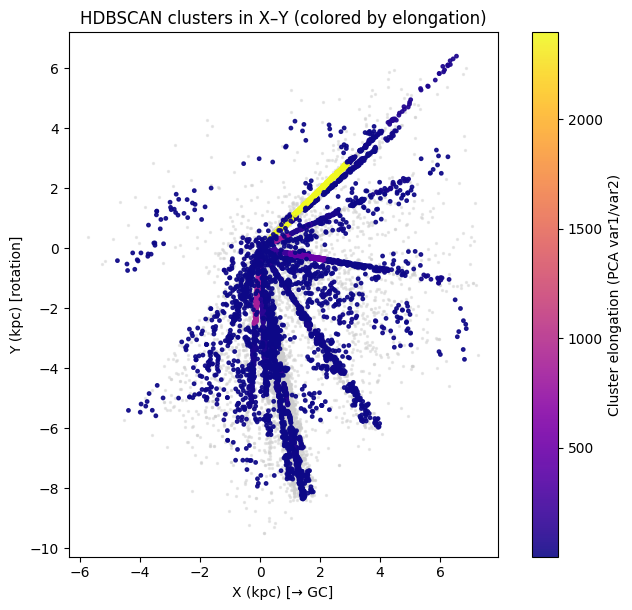

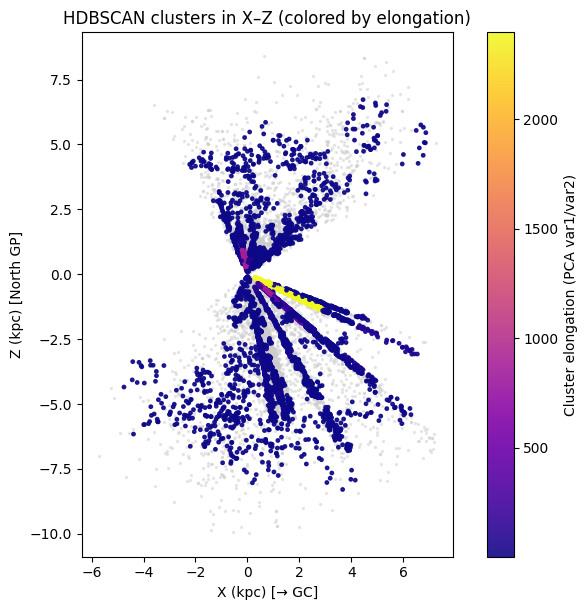


[info] Filament-candidates (elongation ≥ 3.0): [177, 168, 204, 165, 199, 267, 193, 171, 206, 195, 263, 198, 143, 175, 183, 145, 222, 142, 24, 106, 224, 251, 247, 124, 138, 270, 264, 218, 214, 137, 86, 32, 101, 210, 140, 111, 176, 139, 188, 162, 146, 249, 181, 216, 85, 131, 68, 163, 200, 97, 71, 41, 197, 129, 149, 151, 12, 232, 61, 83, 36, 223, 148, 192, 189, 126, 30, 245, 26, 118, 158, 114, 122, 120, 236, 107, 259, 25, 226, 37, 62, 268, 96, 69, 238, 17, 73, 209, 207, 265, 59, 167, 185, 240, 237, 80, 160, 136, 164, 64, 228, 128, 65, 34, 182, 56, 109, 84, 252, 269, 159, 220, 16, 22, 141, 88, 253, 134, 203, 211, 229, 57, 150, 113, 110, 31, 161, 180, 154, 157, 92, 221, 202, 213, 255, 58, 153, 103, 250, 14, 169, 104, 0, 108, 79, 231, 91, 243, 244, 156, 54, 112, 132, 50, 194, 81, 13, 246, 55, 1, 4, 217, 233, 241, 63, 179, 135, 257, 99, 155, 121, 48, 215, 95, 89, 235, 44, 170, 256, 230, 15, 87, 45, 242, 117, 20, 43, 254, 190, 173, 52, 186, 191, 196, 144, 76, 94, 152, 93]


In [3]:
res = analyze_filaments(final,
                        max_dist_kpc=10.0,
                        draw_kde=True,
                        elongation_threshold=3.0,
                        drop_biggest=1,          # drop largest group
                        drop_at_least_label=0)   # consider labels >= 0 for dropping

In [4]:
# =========================
# 0bis) EXTRA CONFIG
# =========================
EXTENT_SIGMA = 2.0   # use 2σ diameter as "extent" (≈ 95% across is ~4σ; pick what you prefer)
RADIAL_ALIGN_MIN = 0.85   # |cos(angle)| threshold to flag radial alignment
RADIAL_ELONG_MIN = 10.0   # elongation (var1/var2) threshold to flag radial "fingers"
RADIAL_MIN_POINTS = 50    # ignore tiny clusters when flagging radial artifacts

In [5]:
import numpy as np
import pandas as pd

# =========================
# CONFIG (tune as needed)
# =========================
EXTENT_SIGMA = 2.0          # diameter = 2 * EXTENT_SIGMA * σ  (e.g., 2→ ~4σ diameter)
RADIAL_ALIGN_MIN = 0.85     # |cos(angle)| threshold for radial alignment
RADIAL_ELONG_MIN = 10.0     # elongation (var1/var2) threshold for “fingers”
RADIAL_MIN_POINTS = 50      # ignore tiny clusters for radial-flagging

# Optional: rule-based filters for remaining clusters
# Example: drop clusters that are too elongated OR too large
DROP_RULES = {
    "max_elongation": 10.0,   # drop if elongation >= this
    "max_members":    500,    # drop if n >= this
    # You can add min/max extent in pc if you like, e.g.:
    # "max_extent_pc_1": 200.0
}

# Optional output files (set to None to skip saving)
SAVE_PER_SOURCE_CSV = None         # e.g., "clean_per_source.csv"
SAVE_CLUSTER_SUMMARY_CSV = None    # e.g., "clean_cluster_summary.csv"

# =========================
# CORE HELPERS
# =========================
def _compute_cluster_shapes_from_coords(coords, labels, extent_sigma=EXTENT_SIGMA):
    """
    Compute per-cluster PCA, shape ratios, physical extents (pc) and radial alignment.

    Returns:
        shape_df: DataFrame with one row per cluster (label != -1)
    """
    from sklearn.decomposition import PCA

    rows = []
    clust_ids = np.unique(labels)
    clust_ids = clust_ids[clust_ids != -1]

    for cid in clust_ids:
        pts = coords[labels == cid]
        if len(pts) < 5:
            continue

        center = pts.mean(axis=0)
        pca = PCA(n_components=3).fit(pts)

        # Variances along PCA axes in kpc^2 and stds in kpc
        var_kpc2 = pca.explained_variance_
        std_kpc  = np.sqrt(var_kpc2)

        # Diameter along each PCA axis (kpc) then to pc
        extent_kpc = 2.0 * extent_sigma * std_kpc
        extent_pc  = extent_kpc * 1000.0

        # Ratios for shape metrics (unitless)
        var_ratio = pca.explained_variance_ratio_
        elong = var_ratio[0] / max(1e-12, var_ratio[1])

        # Radial alignment between PC1 direction and center vector
        v1 = pca.components_[0]                   # unit vector along PC1
        r  = center / (np.linalg.norm(center) + 1e-12)
        radial_align = abs(np.dot(v1, r))         # in [0,1]; 1 = perfectly radial

        rows.append({
            "cluster": int(cid),
            "n": int(len(pts)),
            "center_x": float(center[0]),
            "center_y": float(center[1]),
            "center_z": float(center[2]),
            "var1": float(var_ratio[0]),
            "var2": float(var_ratio[1]),
            "var3": float(var_ratio[2]),
            "elongation": float(elong),
            "extent_pc_1": float(extent_pc[0]),
            "extent_pc_2": float(extent_pc[1]),
            "extent_pc_3": float(extent_pc[2]),
            "extent_kpc_1": float(extent_kpc[0]),
            "extent_kpc_2": float(extent_kpc[1]),
            "extent_kpc_3": float(extent_kpc[2]),
            "radial_align": float(radial_align),
        })

    shape_df = pd.DataFrame(rows).sort_values(["n", "elongation"], ascending=[False, False])
    return shape_df

def _flag_radial_fingers(shape_df,
                         align_min=RADIAL_ALIGN_MIN,
                         elong_min=RADIAL_ELONG_MIN,
                         min_points=RADIAL_MIN_POINTS):
    """Return list of cluster IDs that look like radial distance-axis 'fingers'."""
    if shape_df is None or shape_df.empty:
        return []
    bad = shape_df[
        (shape_df["radial_align"] >= align_min) &
        (shape_df["elongation"] >= elong_min) &
        (shape_df["n"] >= min_points)
    ]
    return bad["cluster"].astype(int).tolist()

def _apply_drop_rules(shape_df, rules):
    """Return list of cluster IDs to drop based on rule dict."""
    if shape_df is None or shape_df.empty or not rules:
        return []
    mask = pd.Series(True, index=shape_df.index)
    if "max_elongation" in rules:
        mask &= shape_df["elongation"] < rules["max_elongation"]
    if "max_members" in rules:
        mask &= shape_df["n"] < rules["max_members"]
    if "max_extent_pc_1" in rules:
        mask &= shape_df["extent_pc_1"] < rules["max_extent_pc_1"]
    if "max_extent_pc_2" in rules:
        mask &= shape_df["extent_pc_2"] < rules["max_extent_pc_2"]
    if "max_extent_pc_3" in rules:
        mask &= shape_df["extent_pc_3"] < rules["max_extent_pc_3"]
    # clusters NOT satisfying mask should be dropped
    to_drop = shape_df.loc[~mask, "cluster"].astype(int).tolist()
    return to_drop

# =========================
# MAIN ENTRY (from your `res`)
# =========================
def postprocess_from_res(res,
                         df_original=None,
                         save_per_source_csv=SAVE_PER_SOURCE_CSV,
                         save_cluster_summary_csv=SAVE_CLUSTER_SUMMARY_CSV,
                         extent_sigma=EXTENT_SIGMA,
                         radial_align_min=RADIAL_ALIGN_MIN,
                         radial_elong_min=RADIAL_ELONG_MIN,
                         radial_min_points=RADIAL_MIN_POINTS,
                         drop_rules=DROP_RULES):
    """
    Start from `res` (output of analyze_filaments):
      - recompute shape table with physical extents (pc)
      - remove radial distance-axis 'fingers'
      - apply rule-based filters (elongation, size, etc.)
      - return cleaned per-source and per-cluster tables
      - optionally save CSVs

    Args:
        res: dict from analyze_filaments()
        df_original: original DataFrame that fed analyze_filaments (to recover columns)
                     If None, per-source output includes only 'cluster_id' and metrics.
    Returns:
        dict with:
          - labels_clean (np.ndarray)
          - kept_cluster_ids (list[int])
          - dropped_cluster_ids (list[int])
          - per_source_df (DataFrame; indexed like df_original where possible)
          - cluster_summary_df (DataFrame)
    """
    # Rebuild coords and labels
    x = np.asarray(res["x"]); y = np.asarray(res["y"]); z = np.asarray(res["z"])
    labels = np.asarray(res["labels"])
    idx = res["index_valid"]               # index into df_original (if provided)
    coords = np.column_stack([x, y, z])

    # Compute shapes (with sizes and radial alignment)
    shape_df = _compute_cluster_shapes_from_coords(coords, labels, extent_sigma=extent_sigma)
    if shape_df.empty:
        print("[warn] No clusters available for shape analysis.")
        labels_clean = labels.copy()
        kept = []
        dropped = []
        # Per-source table
        per_source_df = (df_original.loc[idx].copy() if df_original is not None else pd.DataFrame(index=np.arange(len(labels))))
        per_source_df["cluster_id"] = labels_clean
        return {
            "labels_clean": labels_clean,
            "kept_cluster_ids": kept,
            "dropped_cluster_ids": dropped,
            "per_source_df": per_source_df,
            "cluster_summary_df": shape_df
        }

    # 1) Remove radial-finger artifacts
    radial_bad = _flag_radial_fingers(shape_df,
                                      align_min=radial_align_min,
                                      elong_min=radial_elong_min,
                                      min_points=radial_min_points)
    labels_step = labels.copy()
    for cid in radial_bad:
        labels_step[labels_step == cid] = -1

    # 2) Recompute shapes after removing radial-fingers
    shape_df2 = _compute_cluster_shapes_from_coords(coords, labels_step, extent_sigma=extent_sigma)

    # 3) Apply rule-based drops (elongation, size, etc.)
    rule_bad = _apply_drop_rules(shape_df2, drop_rules)

    labels_clean = labels_step.copy()
    for cid in rule_bad:
        labels_clean[labels_clean == cid] = -1

    # 4) Final shapes after all drops (for reporting/saving)
    shape_df_final = _compute_cluster_shapes_from_coords(coords, labels_clean, extent_sigma=extent_sigma)

    dropped = sorted(set(radial_bad) | set(rule_bad))
    kept = sorted(shape_df_final["cluster"].astype(int).tolist())

    # 5) Build per-source table (map cluster metrics back to each member)
    #    For convenience, we attach per-cluster metrics to each member row.
    metric_cols = ["elongation", "radial_align", "extent_pc_1", "extent_pc_2", "extent_pc_3",
                   "extent_kpc_1", "extent_kpc_2", "extent_kpc_3"]
    metrics_by_cluster = shape_df_final.set_index("cluster")[metric_cols].to_dict(orient="index")

    # Base per-source frame
    if df_original is not None:
        per_source_df = df_original.loc[idx].copy()
    else:
        per_source_df = pd.DataFrame(index=np.arange(len(labels_clean)))

    per_source_df["cluster_id"] = labels_clean

    # attach metrics
    def _get_metric(arr_label, key):
        out = np.full(arr_label.shape, np.nan, dtype=float)
        for k, v in metrics_by_cluster.items():
            sel = (arr_label == int(k))
            if np.any(sel):
                out[sel] = v[key]
        return out

    for k in metric_cols:
        per_source_df[f"cluster_{k}"] = _get_metric(labels_clean, k)

    # 6) Save CSVs (optional)
    if save_per_source_csv:
        per_source_df.to_csv(save_per_source_csv, index=True)
        print(f"[info] Saved per-source table to: {save_per_source_csv}")
    if save_cluster_summary_csv and not shape_df_final.empty:
        shape_df_final.to_csv(save_cluster_summary_csv, index=False)
        print(f"[info] Saved cluster summary to: {save_cluster_summary_csv}")

    # 7) Report
    print(f"[info] Dropped {len(dropped)} clusters (radial artifacts {len(radial_bad)} + rule-based {len(rule_bad)})")
    print(f"[info] Kept {len(kept)} clusters. Noise points: {(labels_clean == -1).sum()}")

    return {
        "labels_clean": labels_clean,
        "kept_cluster_ids": kept,
        "dropped_cluster_ids": dropped,
        "per_source_df": per_source_df,
        "cluster_summary_df": shape_df_final
    }

# =========================
# EXAMPLE USAGE
# =========================
# Assuming you already have:
#   res   = analyze_filaments(final, ...)
#   final = original DataFrame used in analyze_filaments
#
# out = postprocess_from_res(res, df_original=final,
#                            save_per_source_csv="clean_per_source.csv",
#                            save_cluster_summary_csv="clean_cluster_summary.csv")
#
# Access results:
# labels_clean       = out["labels_clean"]
# kept_clusters      = out["kept_cluster_ids"]
# dropped_clusters   = out["dropped_cluster_ids"]
# per_source_table   = out["per_source_df"]
# cluster_summary    = out["cluster_summary_df"]
#
# Example filters on physical size:
# compact = cluster_summary[cluster_summary["extent_pc_1"] < 50]
# print(compact[["cluster","n","elongation","extent_pc_1","extent_pc_2","extent_pc_3"]].head(20))

In [6]:
out = postprocess_from_res(res, df_original=final)

[info] Dropped 79 clusters (radial artifacts 11 + rule-based 68)
[info] Kept 192 clusters. Noise points: 11647


In [7]:
labels_clean       = out["labels_clean"]
kept_clusters      = out["kept_cluster_ids"]
dropped_clusters   = out["dropped_cluster_ids"]
per_source_table   = out["per_source_df"]
cluster_summary    = out["cluster_summary_df"]

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- Equatorial (RA–Dec) ----------
def plot_equatorial_clusters(df, res, out=None, title="Clusters — Equatorial Projection"):
    """
    df   : original dataframe (must have 'ra','dec')
    res  : dict returned by analyze_filaments (has index_valid, labels, x/y/z)
    out  : dict returned by postprocess_from_res (optional; if provided, uses out['labels_clean'])
    """
    # choose labels (cleaned if available)
    labels = np.array(out["labels_clean"]) if (out is not None and "labels_clean" in out) else np.array(res["labels"])
    idx = res["index_valid"]

    ra  = df.loc[idx, "ra"].astype(float).to_numpy()
    dec = df.loc[idx, "dec"].astype(float).to_numpy()

    # wrap RA to [-180, 180] and flip so east→left
    ra_wrapped = ((ra + 180.0) % 360.0) - 180.0
    ra_wrapped = -ra_wrapped

    noise = (labels == -1)
    uniq = np.unique(labels[~noise])

    fig, ax = plt.subplots(figsize=(9, 5))
    ax.scatter(ra_wrapped[noise], dec[noise], s=2, c="0.8", alpha=0.4, label=f"Noise ({noise.sum()})")
    for cid in uniq:
        sel = (labels == cid)
        ax.scatter(ra_wrapped[sel], dec[sel], s=6, alpha=0.8, label=f"C{cid} (n={sel.sum()})")

    ax.set_xlim(180, -180)   # RA increases to the left
    ax.set_ylim(-90, 90)
    ax.axhline(0, ls="--", lw=0.7, alpha=0.6)
    ax.set_xlabel("RA (deg, flipped)")
    ax.set_ylabel("Dec (deg)")
    ax.set_title(title)
    ax.grid(True, lw=0.4, alpha=0.4)
    ax.legend(markerscale=1.6, bbox_to_anchor=(1.02, 1.0), loc="upper left", borderaxespad=0.)
    plt.tight_layout()
    plt.show()


# ---------- 3D XYZ (uses coords from `res`) ----------
def plot_3d_clusters(res, out=None, color_by="cluster", title="3D Cluster Distribution (XYZ, kpc)"):
    """
    res      : dict from analyze_filaments (must contain x,y,z,labels)
    out      : dict from postprocess_from_res (optional; if provided, uses out['labels_clean'])
    color_by : "cluster" or "elongation" (uses per-source elongation from out if available)
    """
    import plotly.graph_objects as go

    # coords always from res
    x = np.asarray(res["x"]); y = np.asarray(res["y"]); z = np.asarray(res["z"])
    labels = np.array(out["labels_clean"]) if (out is not None and "labels_clean" in out) else np.array(res["labels"])

    # optional continuous coloring by elongation (per-source) if available in out
    cvals = None
    cbar_title = None
    if color_by == "elongation" and out is not None and "per_source_df" in out and "cluster_elongation" in out["per_source_df"].columns:
        # Map per_source_df back to the valid index order used in res
        # res["index_valid"] matches df rows used to build x,y,z in same order
        idx = res["index_valid"]
        # out["per_source_df"] is indexed by original df index; align it:
        elong_series = out["per_source_df"].loc[idx, "cluster_elongation"]
        cvals = elong_series.to_numpy(dtype=float)
        cbar_title = "Elongation (var1/var2)"

    noise = (labels == -1)
    uniq = np.unique(labels[~noise])

    fig = go.Figure()

    # Noise
    fig.add_trace(go.Scatter3d(
        x=x[noise], y=y[noise], z=z[noise],
        mode="markers",
        marker=dict(size=1.5, color="lightgray"),
        name=f"Noise ({noise.sum()})"
    ))

    if cvals is not None:
        # One colored cloud for all non-noise points by elongation
        nn = ~noise
        fig.add_trace(go.Scatter3d(
            x=x[nn], y=y[nn], z=z[nn],
            mode="markers",
            marker=dict(size=2.5, color=cvals[nn], colorscale="Plasma", showscale=True, colorbar=dict(title=cbar_title)),
            name="Clusters (colored by elongation)"
        ))
    else:
        # Color by cluster with a categorical palette
        import matplotlib.pyplot as plt
        colors = plt.cm.tab20(np.linspace(0, 1, max(1, len(uniq))))
        for cid, c in zip(uniq, colors):
            sel = (labels == cid)
            fig.add_trace(go.Scatter3d(
                x=x[sel], y=y[sel], z=z[sel],
                mode="markers",
                marker=dict(size=2.5, color=f"rgb({int(c[0]*255)}, {int(c[1]*255)}, {int(c[2]*255)})"),
                name=f"C{cid} (n={sel.sum()})"
            ))

    fig.update_layout(
        scene=dict(
            xaxis_title="X (kpc) [→ Galactic Center]",
            yaxis_title="Y (kpc) [rotation]",
            zaxis_title="Z (kpc) [North GP]",
            aspectmode="data"
        ),
        title=title,
        showlegend=True,
        height=700
    )
    fig.show()

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- Equatorial (RA–Dec) ----------
def plot_equatorial_clusters(df, res, out=None, title="Clusters — Equatorial Projection"):
    """
    df   : original dataframe (must have 'ra','dec')
    res  : dict returned by analyze_filaments (has index_valid, labels, x/y/z)
    out  : dict returned by postprocess_from_res (optional; if provided, uses out['labels_clean'])
    """
    # choose labels (cleaned if available)
    labels = np.array(out["labels_clean"]) if (out is not None and "labels_clean" in out) else np.array(res["labels"])
    idx = res["index_valid"]

    ra  = df.loc[idx, "ra"].astype(float).to_numpy()
    dec = df.loc[idx, "dec"].astype(float).to_numpy()

    # wrap RA to [-180, 180] and flip so east→left
    ra_wrapped = ((ra + 180.0) % 360.0) - 180.0
    ra_wrapped = -ra_wrapped

    noise = (labels == -1)
    uniq = np.unique(labels[~noise])

    fig, ax = plt.subplots(figsize=(9, 5))
    ax.scatter(ra_wrapped[noise], dec[noise], s=2, c="0.8", alpha=0.4, label=f"Noise ({noise.sum()})")
    for cid in uniq:
        sel = (labels == cid)
        ax.scatter(ra_wrapped[sel], dec[sel], s=6, alpha=0.8, label=f"C{cid} (n={sel.sum()})")

    ax.set_xlim(180, -180)   # RA increases to the left
    ax.set_ylim(-90, 90)
    ax.axhline(0, ls="--", lw=0.7, alpha=0.6)
    ax.set_xlabel("RA (deg, flipped)")
    ax.set_ylabel("Dec (deg)")
    ax.set_title(title)
    ax.grid(True, lw=0.4, alpha=0.4)
    ax.legend(markerscale=1.6, bbox_to_anchor=(1.02, 1.0), loc="upper left", borderaxespad=0.)
    plt.tight_layout()
    plt.show()


# ---------- 3D XYZ (uses coords from `res`) ----------
def plot_3d_clusters(res, out=None, color_by="cluster", title="3D Cluster Distribution (XYZ, kpc)"):
    """
    res      : dict from analyze_filaments (must contain x,y,z,labels)
    out      : dict from postprocess_from_res (optional; if provided, uses out['labels_clean'])
    color_by : "cluster" or "elongation" (uses per-source elongation from out if available)
    """
    import plotly.graph_objects as go

    # coords always from res
    x = np.asarray(res["x"]); y = np.asarray(res["y"]); z = np.asarray(res["z"])
    labels = np.array(out["labels_clean"]) if (out is not None and "labels_clean" in out) else np.array(res["labels"])

    # optional continuous coloring by elongation (per-source) if available in out
    cvals = None
    cbar_title = None
    if color_by == "elongation" and out is not None and "per_source_df" in out and "cluster_elongation" in out["per_source_df"].columns:
        # Map per_source_df back to the valid index order used in res
        # res["index_valid"] matches df rows used to build x,y,z in same order
        idx = res["index_valid"]
        # out["per_source_df"] is indexed by original df index; align it:
        elong_series = out["per_source_df"].loc[idx, "cluster_elongation"]
        cvals = elong_series.to_numpy(dtype=float)
        cbar_title = "Elongation (var1/var2)"

    noise = (labels == -1)
    uniq = np.unique(labels[~noise])

    fig = go.Figure()

    # Noise
    fig.add_trace(go.Scatter3d(
        x=x[noise], y=y[noise], z=z[noise],
        mode="markers",
        marker=dict(size=1.5, color="lightgray"),
        name=f"Noise ({noise.sum()})"
    ))

    if cvals is not None:
        # One colored cloud for all non-noise points by elongation
        nn = ~noise
        fig.add_trace(go.Scatter3d(
            x=x[nn], y=y[nn], z=z[nn],
            mode="markers",
            marker=dict(size=2.5, color=cvals[nn], colorscale="Plasma", showscale=True, colorbar=dict(title=cbar_title)),
            name="Clusters (colored by elongation)"
        ))
    else:
        # Color by cluster with a categorical palette
        import matplotlib.pyplot as plt
        colors = plt.cm.tab20(np.linspace(0, 1, max(1, len(uniq))))
        for cid, c in zip(uniq, colors):
            sel = (labels == cid)
            fig.add_trace(go.Scatter3d(
                x=x[sel], y=y[sel], z=z[sel],
                mode="markers",
                marker=dict(size=2.5, color=f"rgb({int(c[0]*255)}, {int(c[1]*255)}, {int(c[2]*255)})"),
                name=f"C{cid} (n={sel.sum()})"
            ))

    fig.update_layout(
        scene=dict(
            xaxis_title="X (kpc) [→ Galactic Center]",
            yaxis_title="Y (kpc) [rotation]",
            zaxis_title="Z (kpc) [North GP]",
            aspectmode="data"
        ),
        title=title,
        showlegend=True,
        height=700
    )
    fig.show()

In [10]:
plot_3d_clusters(res, out, title="Clean Clusters — 3D Distribution (XYZ)")



=== Cluster/point counts ===
Clusters kept: 192
Points total:  14328
  • in clusters: 2681  (18.71%)
  • noise:       11647

=== Size & shape (pc / unitless) ===
Median members per cluster: 12.0 (p90=23.0)
Major diameter median:      481.6 pc (p90=1842.7 pc)
Equivalent radius median:   120.2 pc
Median elongation:          3.82
Median radial_align |cosθ|: 0.79

=== Volume & density ===
Median ellipsoid volume:    7.27e+06 pc³
Median number density:      1.816e-06 stars/pc³


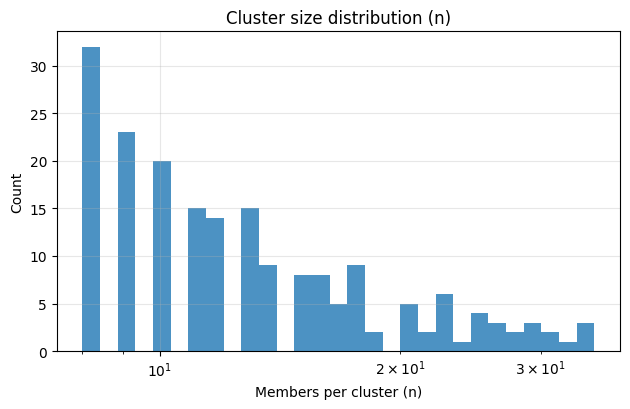

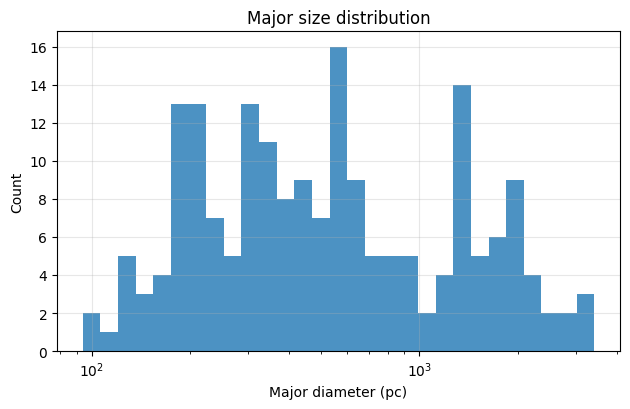

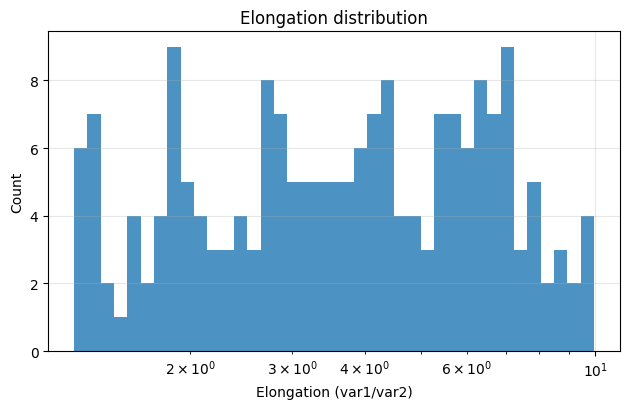

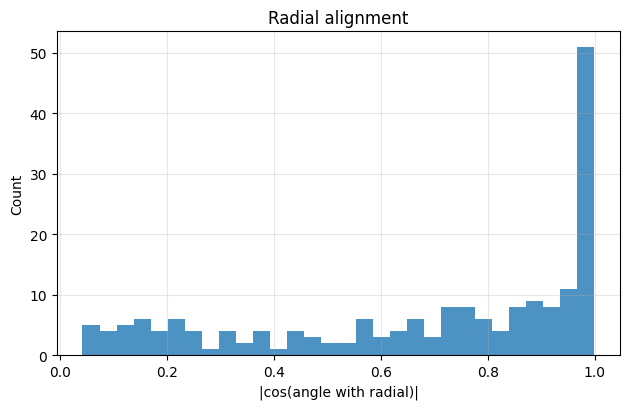

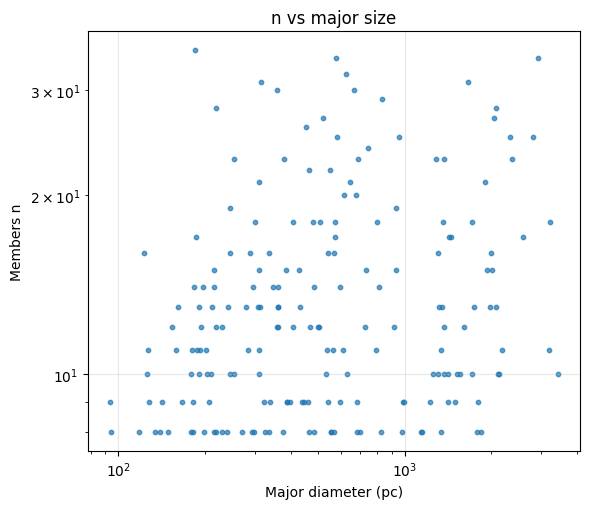

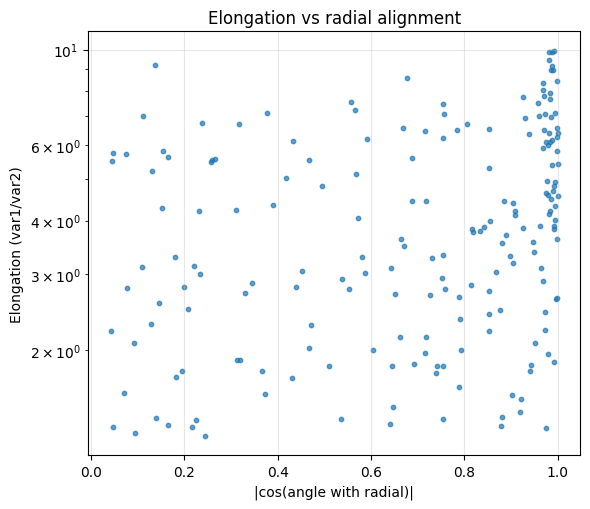

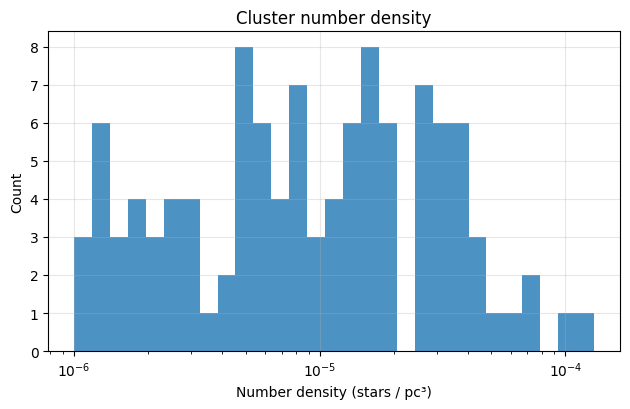


Top compact clusters by density:
Empty DataFrame
Columns: [cluster, n, size_pc_major, size_pc_minor, size_pc_vert, elongation, radial_align, n_density_pc3]
Index: []


In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def summarize_and_plot_clusters(per_source_table, cluster_summary, save_prefix=None):
    """
    Compute rich stats and make key plots:
      - Counts, fractions kept/dropped
      - Size metrics (pc): major/minor/vertical diameters, equivalent radius/diameter
      - Ellipsoidal volume and number density
      - Distributions: n, size_pc_major, elongation, radial_align
      - Correlations: n vs size, elongation vs radial_align

    Parameters
    ----------
    per_source_table : DataFrame from out["per_source_df"]
        Should include column 'cluster_id'. Other columns optional.
    cluster_summary : DataFrame from out["cluster_summary_df"]
        Must include: ['cluster','n','elongation','radial_align',
                        'extent_pc_1','extent_pc_2','extent_pc_3']
    save_prefix : str or None
        If provided, saves figures and an enriched CSV with derived metrics.
    """
    cs = cluster_summary.copy()

    # --- Derived geometric metrics (using your extents as DIAMETERS in pc) ---
    # Semi-axes (pc)
    a = cs['extent_pc_1'].to_numpy(dtype=float) / 2.0
    b = cs['extent_pc_2'].to_numpy(dtype=float) / 2.0
    c = cs['extent_pc_3'].to_numpy(dtype=float) / 2.0

    # Equivalent radius (geo-mean), diameter, ellipsoidal volume, number density
    r_eq = (a * b * c) ** (1/3)                       # pc
    d_eq = 2.0 * r_eq                                  # pc
    vol = (4.0/3.0) * np.pi * (a * b * c)             # pc^3
    number_density = cs['n'].to_numpy(dtype=float) / np.clip(vol, 1e-12, None)  # stars/pc^3

    cs['size_pc_major'] = cs['extent_pc_1']
    cs['size_pc_minor'] = cs['extent_pc_2']
    cs['size_pc_vert' ] = cs['extent_pc_3']
    cs['r_eq_pc']       = r_eq
    cs['d_eq_pc']       = d_eq
    cs['volume_pc3']    = vol
    cs['n_density_pc3'] = number_density

    # -------- Text stats --------
    total_points = len(per_source_table)
    kept_points  = int((per_source_table['cluster_id'] != -1).sum())
    noise_points = total_points - kept_points

    stats = {
        "clusters_kept": int(len(cs)),
        "points_total": int(total_points),
        "points_kept": int(kept_points),
        "points_noise": int(noise_points),
        "frac_points_kept": kept_points / max(1, total_points),
        "n_members_median": float(cs['n'].median()),
        "n_members_p90": float(cs['n'].quantile(0.90)),
        "size_major_median_pc": float(cs['size_pc_major'].median()),
        "size_major_p90_pc": float(cs['size_pc_major'].quantile(0.90)),
        "elongation_median": float(cs['elongation'].median()),
        "radial_align_median": float(cs['radial_align'].median()),
        "r_eq_median_pc": float(cs['r_eq_pc'].median()),
        "volume_median_pc3": float(cs['volume_pc3'].median()),
        "n_density_median": float(cs['n_density_pc3'].median()),
    }

    print("\n=== Cluster/point counts ===")
    print(f"Clusters kept: {stats['clusters_kept']}")
    print(f"Points total:  {stats['points_total']}")
    print(f"  • in clusters: {stats['points_kept']}  ({stats['frac_points_kept']:.2%})")
    print(f"  • noise:       {stats['points_noise']}")

    print("\n=== Size & shape (pc / unitless) ===")
    print(f"Median members per cluster: {stats['n_members_median']:.1f} (p90={stats['n_members_p90']:.1f})")
    print(f"Major diameter median:      {stats['size_major_median_pc']:.1f} pc (p90={stats['size_major_p90_pc']:.1f} pc)")
    print(f"Equivalent radius median:   {stats['r_eq_median_pc']:.1f} pc")
    print(f"Median elongation:          {stats['elongation_median']:.2f}")
    print(f"Median radial_align |cosθ|: {stats['radial_align_median']:.2f}")

    print("\n=== Volume & density ===")
    print(f"Median ellipsoid volume:    {stats['volume_median_pc3']:.2e} pc³")
    print(f"Median number density:      {stats['n_density_median']:.3e} stars/pc³")

    # --- Optionally export enriched cluster summary ---
    if save_prefix:
        cs.to_csv(f"{save_prefix}_cluster_summary_enriched.csv", index=False)
        print(f"[saved] {save_prefix}_cluster_summary_enriched.csv")

    # -------- Plots (matplotlib only) --------
    def _maybe_save(fig, name):
        if save_prefix:
            fig.savefig(f"{save_prefix}_{name}.png", dpi=160, bbox_inches="tight")

    # 1) Distribution of members n (log x)
    fig = plt.figure(figsize=(6.4, 4.2))
    n = cs['n'].to_numpy()
    bins = np.logspace(np.log10(max(1, n.min())), np.log10(n.max()), 30)
    plt.hist(n, bins=bins, alpha=0.8)
    plt.xscale('log')
    plt.xlabel('Members per cluster (n)')
    plt.ylabel('Count')
    plt.title('Cluster size distribution (n)')
    plt.grid(alpha=0.3)
    plt.tight_layout(); _maybe_save(fig, "hist_members"); plt.show()

    # 2) Major diameter (pc)
    fig = plt.figure(figsize=(6.4, 4.2))
    sm = cs['size_pc_major'].to_numpy()
    bins = np.logspace(np.log10(max(1e-2, sm.min())), np.log10(max(sm.max(), 1.0)), 30)
    plt.hist(sm, bins=bins, alpha=0.8)
    plt.xscale('log')
    plt.xlabel('Major diameter (pc)')
    plt.ylabel('Count')
    plt.title('Major size distribution')
    plt.grid(alpha=0.3)
    plt.tight_layout(); _maybe_save(fig, "hist_size_major"); plt.show()

    # 3) Elongation
    fig = plt.figure(figsize=(6.4, 4.2))
    el = cs['elongation'].to_numpy()
    bins = np.logspace(np.log10(max(1.0, el.min())), np.log10(max(el.max(), 1.1)), 40)
    plt.hist(el, bins=bins, alpha=0.8)
    plt.xscale('log')
    plt.xlabel('Elongation (var1/var2)')
    plt.ylabel('Count')
    plt.title('Elongation distribution')
    plt.grid(alpha=0.3)
    plt.tight_layout(); _maybe_save(fig, "hist_elongation"); plt.show()

    # 4) Radial alignment
    fig = plt.figure(figsize=(6.4, 4.2))
    plt.hist(cs['radial_align'].to_numpy(), bins=30, alpha=0.8)
    plt.xlabel('|cos(angle with radial)|')
    plt.ylabel('Count')
    plt.title('Radial alignment')
    plt.grid(alpha=0.3)
    plt.tight_layout(); _maybe_save(fig, "hist_radial_align"); plt.show()

    # 5) n vs major size (log-log)
    fig = plt.figure(figsize=(6.0, 5.2))
    plt.scatter(cs['size_pc_major'], cs['n'], s=10, alpha=0.7)
    plt.xscale('log'); plt.yscale('log')
    plt.xlabel('Major diameter (pc)')
    plt.ylabel('Members n')
    plt.title('n vs major size')
    plt.grid(alpha=0.3)
    plt.tight_layout(); _maybe_save(fig, "scatter_n_vs_size"); plt.show()

    # 6) Elongation vs radial alignment (flagging distance-axis fingers)
    fig = plt.figure(figsize=(6.0, 5.2))
    plt.scatter(cs['radial_align'], cs['elongation'], s=10, alpha=0.7)
    plt.yscale('log')
    plt.xlabel('|cos(angle with radial)|')
    plt.ylabel('Elongation (var1/var2)')
    plt.title('Elongation vs radial alignment')
    plt.grid(alpha=0.3)
    plt.tight_layout(); _maybe_save(fig, "scatter_elong_vs_align"); plt.show()

    # 7) Number density
    fig = plt.figure(figsize=(6.4, 4.2))
    dens = cs['n_density_pc3'].replace([np.inf, -np.inf], np.nan).dropna()
    if len(dens) > 0:
        bins = np.logspace(np.log10(max(1e-6, dens.min())), np.log10(max(dens.max(), 1e-6)), 30)
        plt.hist(dens, bins=bins, alpha=0.8)
        plt.xscale('log')
    else:
        plt.hist([], bins=30)
    plt.xlabel('Number density (stars / pc³)')
    plt.ylabel('Count')
    plt.title('Cluster number density')
    plt.grid(alpha=0.3)
    plt.tight_layout(); _maybe_save(fig, "hist_density"); plt.show()

    return cs, stats

# ---- Run it ----
enriched_cluster_summary, stats = summarize_and_plot_clusters(per_source_table, cluster_summary, save_prefix=None)

# Example: pick "good" compact clusters (you can tune thresholds)
good = enriched_cluster_summary[
    (enriched_cluster_summary['elongation'] < 10) &
    (enriched_cluster_summary['size_pc_major'] < 100) &
    (enriched_cluster_summary['radial_align'] < 0.8) &
    (enriched_cluster_summary['n'] >= 10)
].sort_values(['n_density_pc3','n'], ascending=[False, False])

print("\nTop compact clusters by density:")
print(good[['cluster','n','size_pc_major','size_pc_minor','size_pc_vert','elongation','radial_align','n_density_pc3']].head(20).to_string(index=False))

In [12]:
import numpy as np
import pandas as pd
from math import pi

# --- 1) helper: recompute PCA extents if needed ---
def _recompute_extents_from_res(res, labels_clean, extent_sigma=2.0):
    from sklearn.decomposition import PCA
    x = np.asarray(res["x"]); y = np.asarray(res["y"]); z = np.asarray(res["z"])
    coords = np.column_stack([x, y, z])

    rows = []
    ids = np.unique(labels_clean)
    ids = ids[ids != -1]
    for cid in ids:
        pts = coords[labels_clean == cid]
        if len(pts) < 5: 
            continue
        center = pts.mean(axis=0)
        pca = PCA(n_components=3).fit(pts)
        var = pca.explained_variance_        # kpc^2
        std = np.sqrt(var)                   # kpc
        extent_kpc = 2.0 * extent_sigma * std
        extent_pc  = extent_kpc * 1000.0
        var_ratio  = pca.explained_variance_ratio_
        elong = var_ratio[0]/max(1e-12, var_ratio[1])
        v1 = pca.components_[0]
        r  = center/(np.linalg.norm(center)+1e-12)
        radial_align = abs(np.dot(v1, r))
        rows.append({
            "cluster": int(cid),
            "n": int(len(pts)),
            "extent_pc_1": float(extent_pc[0]),
            "extent_pc_2": float(extent_pc[1]),
            "extent_pc_3": float(extent_pc[2]),
            "elongation": float(elong),
            "radial_align": float(radial_align),
        })
    return pd.DataFrame(rows)

# --- 2) ensure we have densities in cluster_summary ---
cs = out["cluster_summary_df"].copy()

need_extents = not set(["extent_pc_1","extent_pc_2","extent_pc_3"]).issubset(cs.columns)
need_density = ("n_density_pc3" not in cs.columns) or cs["n_density_pc3"].isna().all()

if need_extents or need_density:
    # Try to fill missing extents by recomputing from res + cleaned labels
    if need_extents:
        df_ext = _recompute_extents_from_res(res, out["labels_clean"])
        # merge any missing columns
        cs = cs.merge(df_ext, on=["cluster","n"], how="left", suffixes=("","_recomp"))
        # prefer existing; if missing, take recomputed
        for col in ["extent_pc_1","extent_pc_2","extent_pc_3","elongation","radial_align"]:
            if col not in cs.columns:
                cs[col] = cs[f"{col}_recomp"]
            else:
                cs[col] = cs[col].fillna(cs[f"{col}_recomp"])
        # clean extra columns
        drop_cols = [c for c in cs.columns if c.endswith("_recomp")]
        if drop_cols: cs = cs.drop(columns=drop_cols)

    # compute number density from ellipsoid volume (pc^3)
    a = cs["extent_pc_1"].astype(float) / 2.0
    b = cs["extent_pc_2"].astype(float) / 2.0
    c = cs["extent_pc_3"].astype(float) / 2.0
    vol_pc3 = (4.0/3.0) * pi * (a*b*c)
    cs["n_density_pc3"] = cs["n"].astype(float) / np.clip(vol_pc3, 1e-12, None)

# --- 3) estimate background noise density (stars/pc^3) from bounding box ---
x = np.asarray(res["x"]); y = np.asarray(res["y"]); z = np.asarray(res["z"])
labels_all = out["labels_clean"]
noise_mask = (labels_all == -1)

if noise_mask.any():
    vol_kpc3 = (x[noise_mask].max()-x[noise_mask].min()) * \
               (y[noise_mask].max()-y[noise_mask].min()) * \
               (z[noise_mask].max()-z[noise_mask].min())
    noise_density_pc3 = noise_mask.sum() / max(vol_kpc3*1e9, 1e-12)  # kpc^3→pc^3
else:
    noise_density_pc3 = 1e-12  # fallback tiny

# --- 4) contrast vs noise + quick table ---
cs["contrast_vs_noise"] = cs["n_density_pc3"] / max(noise_density_pc3, 1e-12)
cs = cs.sort_values("contrast_vs_noise", ascending=False)

print(f"Estimated background noise density: {noise_density_pc3:.3e} stars/pc³\n")
print(cs[["cluster","n","n_density_pc3","contrast_vs_noise","elongation","radial_align"]]
      .head(20).to_string(index=False))

# If you want this back in `out`:
out["cluster_summary_df"] = cs

Estimated background noise density: 3.070e-09 stars/pc³

 cluster  n  n_density_pc3  contrast_vs_noise  elongation  radial_align
     225  8       0.000131       42606.540580    2.077888      0.951537
     268 15       0.000097       31697.149173    6.927813      0.930659
     201  8       0.000072       23519.389700    1.763691      0.739870
     170  9       0.000071       23212.900813    3.109153      0.643234
     156 10       0.000067       21749.164742    9.887648      0.980358
     227  9       0.000048       15557.776048    1.962793      0.715958
     172 10       0.000048       15498.867547    2.773548      0.758192
     266 35       0.000041       13391.859273    2.446131      0.973006
     240 14       0.000041       13322.058700    6.986772      0.960033
     236 16       0.000040       12981.085438    4.939514      0.976354
     235  9       0.000036       11653.953571    4.211594      0.230838
     250 11       0.000035       11447.428153    7.517357      0.957702
     26

In [53]:
good_clusters = cluster_summary[
    (cluster_summary['radial_align'] < 0.8) &
    (cluster_summary['elongation'] < 10)
]

In [54]:
good_clusters

,cluster,n,center_x,center_y,center_z,var1,var2,var3,elongation,extent_pc_1,extent_pc_2,extent_pc_3,extent_kpc_1,extent_kpc_2,extent_kpc_3,radial_align
227,253,115,0.424124,-6.117827,3.921090,0.767819,0.121419,0.110762,6.323691,3117.753099,1239.813635,1184.153353,3.117753,1.239814,1.184153,0.020205
2683,3078,84,-0.919561,-2.785639,0.173422,0.706712,0.204868,0.088420,3.449591,443.590884,238.835469,156.904974,0.443591,0.238835,0.156905,0.589751
162,182,83,4.492026,-4.858009,5.683142,0.550692,0.324938,0.124370,1.694761,2242.619063,1722.666775,1065.759295,2.242619,1.722667,1.065759,0.368027
1116,1273,77,1.651307,-0.861196,1.411206,0.756865,0.130202,0.112933,5.813016,854.650395,354.476729,330.133034,0.854650,0.354477,0.330133,0.658980
2008,2272,76,-1.805336,-4.274262,-0.590049,0.516373,0.398915,0.084712,1.294444,423.927567,372.606150,171.704287,0.423928,0.372606,0.171704,0.293156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1363,1541,8,-3.523411,-5.017480,-1.312063,0.508681,0.428424,0.062896,1.187331,163.594046,150.134874,57.524869,0.163594,0.150135,0.057525,0.228174
962,1103,8,2.742548,-3.751342,-4.541759,0.489497,0.424582,0.085921,1.152893,209.553527,195.164337,87.794847,0.209554,0.195164,0.087795,0.762729
1096,1245,8,2.769664,0.188638,-0.024045,0.509589,0.456095,0.034317,1.117288,139.879628,132.334140,36.299119,0.139880,0.132334,0.036299,0.242636
688,780,8,0.950280,-7.318365,1.296827,0.491799,0.457089,0.051112,1.075938,311.613310,300.415580,100.457554,0.311613,0.300416,0.100458,0.110863


In [30]:
import numpy as np
import pandas as pd

def montecarlo_random_filaments(x, y, z, n_iter=200, algo="DBSCAN", eps=0.3, min_samples=8):
    """
    Monte Carlo test: randomize positions, recluster, record elongation distribution.

    Returns:
        random_elongations : list of all elongations from random clusters
    """
    from sklearn.cluster import DBSCAN
    from sklearn.decomposition import PCA

    rng = np.random.default_rng(42)
    random_elongations = []

    for _ in range(n_iter):
        # shuffle or uniform resample within bounding box
        xr = rng.uniform(x.min(), x.max(), len(x))
        yr = rng.uniform(y.min(), y.max(), len(y))
        zr = rng.uniform(z.min(), z.max(), len(z))
        coords = np.column_stack([xr, yr, zr])

        db = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1).fit(coords)
        labels = db.labels_
        ids = np.unique(labels[labels != -1])
        for cid in ids:
            pts = coords[labels == cid]
            if len(pts) < 5:
                continue
            pca = PCA(n_components=3).fit(pts)
            var = pca.explained_variance_ratio_
            elong = var[0] / max(1e-9, var[1])
            random_elongations.append(elong)

    return np.array(random_elongations)

      cluster     n  elongation   p_value
3014     3014  4563  407.320481  0.000000
2453     2453    10  358.020811  0.000000
2593     2593    14  225.763540  0.000000
2961     2961    65  276.336612  0.000000
943       943     8  257.514851  0.000000
...       ...   ...         ...       ...
2316     2316    11    1.067764  0.996042
1407     1407    42    1.061653  0.996576
172       172     9    1.058688  0.996746
734       734    20    1.052794  0.997207
2777     2777    12    1.027012  0.999393

[3080 rows x 4 columns]


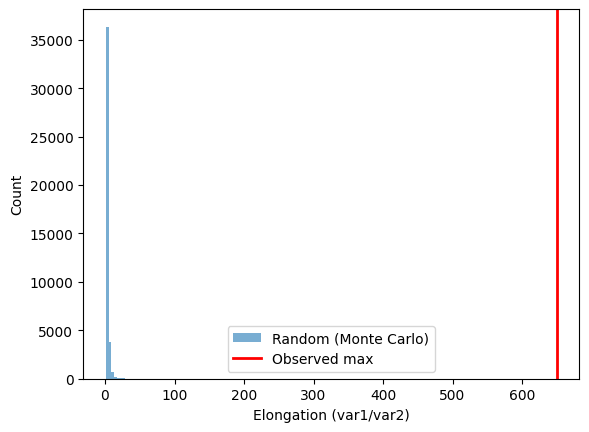

In [31]:
# Now extract the coordinates used internally
x = res["x"]
y = res["y"]
z = res["z"]

# Run Monte Carlo significance test
rand_elong = montecarlo_random_filaments(x, y, z, n_iter=200, eps=0.3, min_samples=8)

# Compare observed elongations to random baseline
obs_elong = res['shape_df']['elongation']
pvals = [np.mean(rand_elong >= e) for e in obs_elong]
res['shape_df']['p_value'] = pvals

# Display ranked results
print(res['shape_df'][['cluster','n','elongation','p_value']].sort_values('p_value'))

# Optional visualization
plt.hist(rand_elong, bins=50, alpha=0.6, label='Random (Monte Carlo)')
plt.axvline(obs_elong.max(), color='r', lw=2, label='Observed max')
plt.legend(); plt.xlabel('Elongation (var1/var2)'); plt.ylabel('Count'); plt.show()

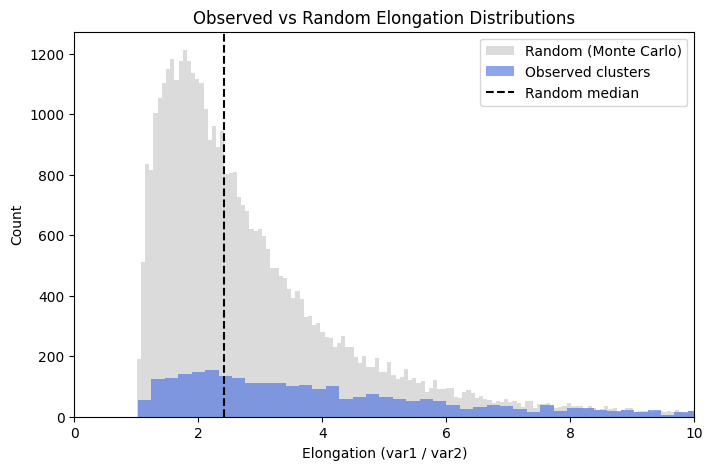

In [36]:
plt.figure(figsize=(8,5))
plt.hist(rand_elong, bins=3000, color='lightgray', alpha=0.8, label='Random (Monte Carlo)')
plt.hist(res['shape_df']['elongation'], bins=3000, alpha=0.6, color='royalblue', label='Observed clusters')
plt.axvline(np.median(rand_elong), color='k', ls='--', label='Random median')
plt.xlabel('Elongation (var1 / var2)')
plt.ylabel('Count')

plt.xlim(0, 10)
plt.legend()
plt.title('Observed vs Random Elongation Distributions')
plt.show()

In [12]:
final[final['dec'] > 5]

,id,ra,dec,parallax,gaia_ruwe,gaia_parallax_over_error,gaia_classprob_dsc_combmod_star,gaia_in_qso_candidates,gaia_in_galaxy_candidates,gaia_phot_bp_rp_excess_factor,...,method,gaia_source_id,source_id,r_med_geo,r_lo_geo,r_hi_geo,r_med_photogeo,r_lo_photogeo,r_hi_photogeo,flag
601707,b'i06n05n54008H4',221.70934,5.005817,-0.681331,1.135561,-1.014606,9.999816e-01,0.0,0.0,1.201303,...,WLS-continuum,1.158807e+18,1.158807e+18,3408.58789,1544.85364,6962.36084,3195.78906,2648.17871,3774.85742,10033.0
601708,b'i06n05n540099X',222.56734,5.035755,-0.033960,1.058333,-0.071947,7.770162e-06,1.0,0.0,1.211695,...,r-i-fallback,1.158375e+18,1.158375e+18,2687.57764,1532.50623,3742.27124,3269.20850,1778.32312,6025.72217,10022.0
601709,b'i06n05n54009DG',221.67160,5.040119,-0.409496,0.939062,-0.625891,9.999908e-01,0.0,0.0,1.340206,...,WLS-continuum,1.158808e+18,1.158808e+18,7212.70898,4509.26221,9099.10938,5894.62451,4972.86084,6742.40674,10033.0
601710,b'i06n05n5400ATJ',222.17890,5.085896,0.229280,1.057514,0.746083,4.159792e-18,1.0,0.0,1.336057,...,WLS-continuum,1.159134e+18,1.159134e+18,3439.11523,2023.09912,5203.61279,9634.60254,7591.70361,11624.75200,10033.0
601711,b'i06n05n5400E5K',222.86624,5.195259,-0.211662,0.933997,-0.528099,2.039337e-19,1.0,0.0,1.206166,...,WLS-continuum,1.158403e+18,1.158403e+18,4293.35010,2333.48755,7369.15479,17404.16990,14572.70510,20461.90430,10022.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
635751,b'i06n05n5500XN4',224.07257,5.914393,-0.329276,0.953087,-0.535499,1.479864e-07,1.0,0.0,0.999081,...,WLS-continuum,1.160039e+18,1.160039e+18,12226.55760,4107.71338,15392.48930,2863.44482,1411.52454,5207.63525,11022.0
635752,b'i06n05n5500YD5',223.30853,5.937606,-1.436702,0.955691,-1.826597,9.999925e-01,0.0,0.0,1.233370,...,WLS-continuum,1.159303e+18,1.159303e+18,5742.46289,2313.76709,8461.05859,7218.29492,6040.90967,8821.87402,21033.0
635753,b'i06n05n5500Z4E',223.24109,5.961048,0.500728,0.971759,1.514987,9.999893e-01,0.0,0.0,1.134605,...,WLS-continuum,1.159299e+18,1.159299e+18,1649.34436,1165.14612,2752.65063,6496.35352,5593.48047,8194.05371,10033.0
635754,b'i06n05n5500ZUD',223.29634,5.985601,0.215460,1.013131,0.586618,9.999929e-01,0.0,0.0,1.124312,...,WLS-continuum,1.159304e+18,1.159304e+18,3170.52588,1532.50586,6406.26025,6022.55371,4983.79199,7126.08545,10033.0


In [14]:
import numpy as np
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================
# 0) CONFIG
# =========================
MAX_DIST_KPC = 10.0
USE_HDBSCAN = True         # if installed, use it; else falls back to DBSCAN
# HDBSCAN params (good for many small/filamentary groups)
HDBSCAN_MIN_CLUSTER_SIZE = 8
HDBSCAN_MIN_SAMPLES     = 3
HDBSCAN_CSEPS           = 0.05  # cluster_selection_epsilon (kpc-ish scale)

# DBSCAN fallback params (tune to your scale, in kpc)
DBSCAN_EPS         = 0.30
DBSCAN_MIN_SAMPLES = 8

# Output (optional)
SAVE_PER_SOURCE_CSV = None   # e.g., "filament_labels.csv"
SAVE_SUMMARY_CSV    = None   # e.g., "filament_clusters_summary.csv"

# Plot ranges
XY_RANGE = (-10, 10, -10, 10)
XZ_RANGE = (-10, 10,  -5,  5)

# =========================
# 1) COORDINATE UTILS
# =========================
def pick_distance_kpc(df):
    """
    Choose distance (kpc) with preference:
    r_med_photogeo -> r_med_geo -> 1/parallax (parallax in mas).
    Assumes r_* are in pc.
    """
    d_pc = np.full(len(df), np.nan, dtype="float64")
    if 'r_med_photogeo' in df.columns:
        arr = pd.to_numeric(df['r_med_photogeo'], errors='coerce')
        d_pc = np.where(np.isfinite(arr), arr, d_pc)
    if 'r_med_geo' in df.columns:
        need = ~np.isfinite(d_pc)
        arr = pd.to_numeric(df.loc[need, 'r_med_geo'], errors='coerce')
        d_pc[need] = arr.values
    if 'parallax' in df.columns:
        need = ~np.isfinite(d_pc)
        par = pd.to_numeric(df.loc[need, 'parallax'], errors='coerce').to_numpy()
        with np.errstate(divide='ignore', invalid='ignore'):
            d_from_par_pc = 1000.0 / par  # pc
        d_pc[need] = d_from_par_pc
    return d_pc / 1000.0

def radec_to_galactic(ra_deg, dec_deg):
    """ICRS (deg) -> Galactic (l,b) deg using the standard J2000 matrix."""
    ra  = np.radians(ra_deg)
    dec = np.radians(dec_deg)
    x_icrs = np.cos(dec) * np.cos(ra)
    y_icrs = np.cos(dec) * np.sin(ra)
    z_icrs = np.sin(dec)
    v = np.vstack([x_icrs, y_icrs, z_icrs])
    R = np.array([
        [-0.0548755604162154, -0.8734370902348850, -0.4838350155487132],
        [ 0.4941094278755837, -0.4448296299600112,  0.7469822444972189],
        [-0.8676661490190047, -0.1980763734312015,  0.4559837761750669]
    ])
    g = R @ v
    x_gal, y_gal, z_gal = g
    l = np.degrees(np.arctan2(y_gal, x_gal)) % 360.0
    b = np.degrees(np.arcsin(z_gal))
    return l, b

def gal_to_heliocentric_xyz(l_deg, b_deg, d_kpc):
    """Galactic (l,b, d[kpc]) -> Heliocentric Cartesian (X,Y,Z) in kpc."""
    l = np.radians(l_deg)
    b = np.radians(b_deg)
    cosb = np.cos(b)
    x = d_kpc * cosb * np.cos(l)
    y = d_kpc * cosb * np.sin(l)
    z = d_kpc * np.sin(b)
    return x, y, z

def build_xyz(df, max_dist_kpc=MAX_DIST_KPC):
    """Return XYZ (kpc) and valid row index within max_dist_kpc."""
    d_kpc = pick_distance_kpc(df)
    ok = np.isfinite(d_kpc) & (d_kpc > 0) & (d_kpc <= max_dist_kpc)
    if not np.any(ok):
        raise ValueError("No valid distances within the given max_dist_kpc.")
    l_deg, b_deg = radec_to_galactic(df.loc[ok, 'ra'].astype(float),
                                     df.loc[ok, 'dec'].astype(float))
    x, y, z = gal_to_heliocentric_xyz(l_deg, b_deg, d_kpc[ok])
    return x, y, z, df.index[ok]


# ---- helper: convert RA/Dec to Galactic (l,b) for rows within max distance ----
def lb_subset(df, max_dist_kpc=10.0):
    d_kpc = pick_distance_kpc(df)
    ok = np.isfinite(d_kpc) & (d_kpc > 0) & (d_kpc <= max_dist_kpc)
    if not np.any(ok):
        raise ValueError("No sources within max_dist_kpc.")
    l_deg, b_deg = radec_to_galactic(df.loc[ok, 'ra'].astype(float),
                                     df.loc[ok, 'dec'].astype(float))
    # wrap l to [-180, +180] for centered projections
    l_wrapped = ((l_deg + 180.0) % 360.0) - 180.0
    return l_wrapped, b_deg, d_kpc[ok], ok

# ---- 1) All-sky Hammer/Aitoff scatter (fast) ----
def plot_sky_scatter(df, max_dist_kpc=10.0, projection='hammer',
                     color_by='distance', labels=None, ok_mask=None,
                     s=2, alpha=0.6, cmap='plasma'):
    """
    projection: 'hammer' or 'aitoff'
    color_by: 'distance' | 'EW' | 'none' | 'cluster' (requires labels)
    labels: array of cluster labels aligned to df.loc[ok_mask] if color_by='cluster'
    """
    l, b, d_kpc, ok = lb_subset(df, max_dist_kpc)
    if ok_mask is None:
        ok_mask = ok

    # choose colors
    if color_by == 'distance':
        c = d_kpc
        cbar_label = 'Distance (kpc)'
    elif color_by == 'EW' and 'EW_Ha' in df.columns:
        c = df.loc[ok, 'EW_Ha'].astype(float).to_numpy()
        cbar_label = 'EW(Hα) [Å]'
    elif color_by == 'cluster' and labels is not None:
        c = labels[ok] if len(labels) == len(df) else labels  # labels should match subset
        cbar_label = 'Cluster ID'
        cmap = 'tab20'
    else:
        c = None
        cbar_label = None

    # radians for sky projections
    lon = np.radians(l)
    lat = np.radians(b)

    fig = plt.figure(figsize=(8.5, 5.2))
    ax = fig.add_subplot(111, projection=projection)
    sc = ax.scatter(lon, lat, s=s, alpha=alpha, c=c, cmap=cmap)

    ax.set_title(f'All-sky {projection.capitalize()} — Galactic (l,b)  (≤ {max_dist_kpc:.1f} kpc)')
    ax.grid(True, lw=0.5, alpha=0.4)

    if c is not None:
        cb = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.06, fraction=0.05)
        cb.set_label(cbar_label)

    plt.tight_layout()
    plt.show()

# ---- 2) HEALPix density map (best to see footprint/coverage) ----
def plot_healpix_density(df, max_dist_kpc=10.0, nside=256, projection='aitoff',
                         quantity='count', vmin=None, vmax=None, cmap='viridis'):
    """
    quantity: 'count'   → counts per pixel (sky coverage / footprint)
              'meanEW'  → mean EW per pixel
              'meandist'→ mean distance per pixel
    Requires healpy. If not available, we fallback to a hexbin in (l,b).
    """
    try:
        import healpy as hp
        has_hp = True
    except Exception as e:
        print(f"[warn] healpy unavailable ({e}). Falling back to hexbin.")
        has_hp = False

    l, b, d_kpc, ok = lb_subset(df, max_dist_kpc)
    # convert to theta, phi for HEALPix (radians): theta = colat = 90°-b, phi = l in [0, 2π)
    phi = np.radians((l + 360.0) % 360.0)
    theta = np.radians(90.0 - b)

    if has_hp:
        npix = hp.nside2npix(nside)
        m = np.zeros(npix, dtype=float)
        w = np.zeros(npix, dtype=float)
        pix = hp.ang2pix(nside, theta, phi)

        if quantity == 'count':
            # simply count occurrences
            for p in pix: m[p] += 1.0
            title = f'Footprint / density (NSIDE={nside})'
            unit  = 'count'
        elif quantity == 'meanEW' and 'EW_Ha' in df.columns:
            vals = df.loc[ok, 'EW_Ha'].astype(float).to_numpy()
            for p, val in zip(pix, vals):
                m[p] += val; w[p] += 1.0
            with np.errstate(invalid='ignore', divide='ignore'):
                m = np.where(w>0, m/w, np.nan)
            title = f'Mean EW(Hα) per pixel (NSIDE={nside})'
            unit  = 'Å'
        elif quantity == 'meandist':
            vals = d_kpc
            for p, val in zip(pix, vals):
                m[p] += val; w[p] += 1.0
            with np.errstate(invalid='ignore', divide='ignore'):
                m = np.where(w>0, m/w, np.nan)
            title = f'Mean distance per pixel (NSIDE={nside})'
            unit  = 'kpc'
        else:
            raise ValueError("quantity must be 'count', 'meanEW', or 'meandist' (need EW_Ha column for meanEW).")

        if projection not in {'aitoff','mollweide','hammer'}:
            projection = 'aitoff'
        hp.mollview(m, coord='G',
                    title=title if projection=='mollweide' else '',
                    unit=unit, min=vmin, max=vmax, cmap=cmap,
                    norm=None)  # you can set norm='log' for counts
        # switch projection if requested (healpy uses mollview; for others we can emulate with projview)
        if projection in {'aitoff','hammer'}:
            hp.projview(m, coord='G', projection=projection, unit=unit,
                        min=vmin, max=vmax, cmap=cmap, title=title)
        hp.graticule()
        plt.show()
    else:
        # Fallback: 2D hexbin in (l,b)
        lon = np.radians(l); lat = np.radians(b)
        fig = plt.figure(figsize=(8.5, 5.2))
        ax = fig.add_subplot(111, projection='aitoff' if projection not in {'aitoff','hammer'} else projection)
        # hexbin wants Cartesian; for projection consistency, use scatter density instead:
        sc = ax.scatter(lon, lat, s=1, c='k', alpha=0.3)
        ax.set_title(f'All-sky {projection.capitalize()} (fallback scatter) — Galactic (l,b)')
        ax.grid(True, lw=0.5, alpha=0.4)
        plt.tight_layout(); plt.show()

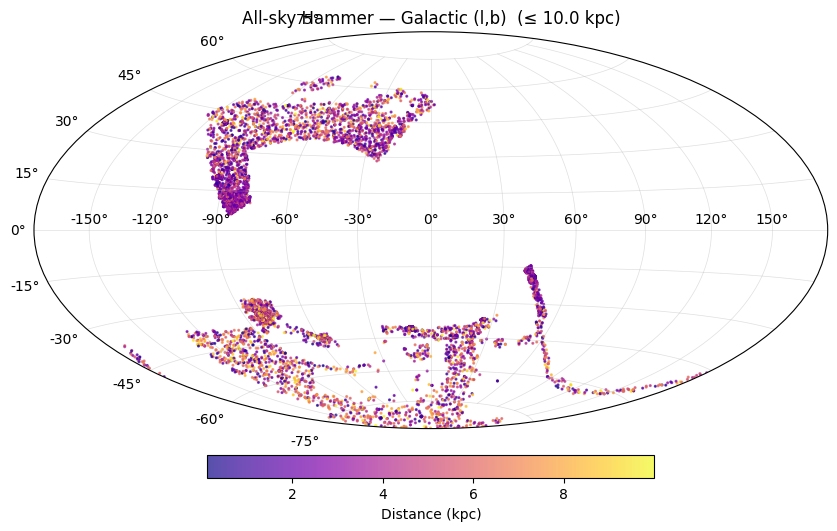

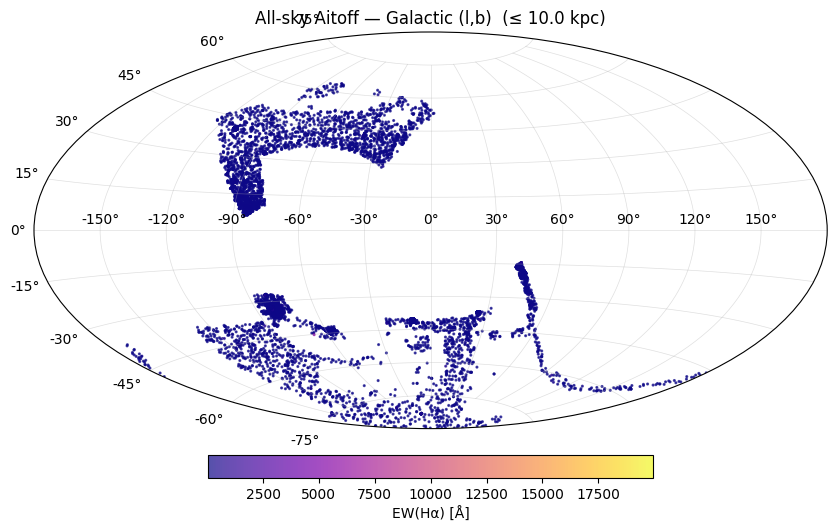

In [15]:
plot_sky_scatter(final, max_dist_kpc=10.0, projection='hammer', color_by='distance', s=1.5, alpha=0.7)
plot_sky_scatter(final, max_dist_kpc=10.0, projection='aitoff',  color_by='EW',       s=1.5, alpha=0.7)

In [13]:
def plot_sky_equatorial(df, max_dist_kpc=10.0, projection='mollweide',
                        color_by='distance', labels=None, s=2, alpha=0.6, cmap='plasma'):
    # subset by distance using your existing helper
    d_kpc = pick_distance_kpc(df)
    ok = np.isfinite(d_kpc) & (d_kpc > 0) & (d_kpc <= max_dist_kpc)
    if not np.any(ok):
        raise ValueError("No sources within max_dist_kpc.")

    ra = df.loc[ok, 'ra'].astype(float).to_numpy()   # deg
    dec = df.loc[ok, 'dec'].astype(float).to_numpy() # deg

    # Choose colors
    if color_by == 'distance':
        c = d_kpc[ok]
        cbar_label = 'Distance (kpc)'
    elif color_by == 'EW' and 'EW_Ha' in df.columns:
        c = df.loc[ok, 'EW_Ha'].astype(float).to_numpy()
        cbar_label = 'EW(Hα) [Å]'
    elif color_by == 'cluster' and labels is not None:
        # labels must align to df (full), we subset with ok
        c = np.asarray(labels)[ok]
        cbar_label = 'Cluster ID'
        cmap = 'tab20'
    else:
        c = None
        cbar_label = None

    # Wrap RA to [-180, +180] and flip so that RA increases to the left
    ra_wrapped = ((ra + 180.0) % 360.0) - 180.0
    ra_wrapped = -ra_wrapped  # flip RA axis (astronomical convention)

    # Convert to radians for sky projections
    lon = np.radians(ra_wrapped)
    lat = np.radians(dec)

    fig = plt.figure(figsize=(8.8, 5.4))
    ax = fig.add_subplot(111, projection=projection)  # 'mollweide'|'aitoff'|'hammer'
    sc = ax.scatter(lon, lat, s=s, alpha=alpha, c=c, cmap=cmap)

    ax.set_title(f'All-sky {projection.capitalize()} — Equatorial (RA, Dec)  (≤ {max_dist_kpc:.1f} kpc)')
    ax.grid(True, lw=0.6, alpha=0.4)

    if c is not None:
        cb = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.06, fraction=0.05)
        cb.set_label(cbar_label)

    plt.tight_layout()
    plt.show()

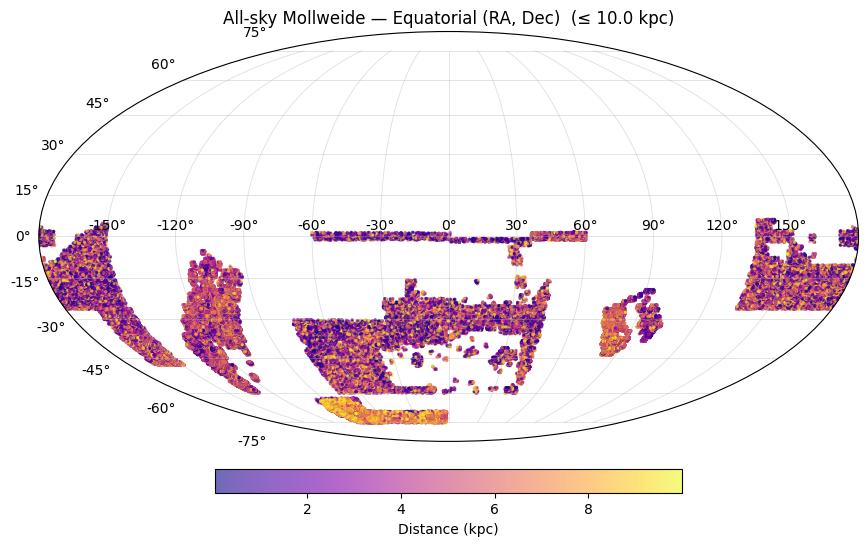

In [14]:
plot_sky_equatorial(final, max_dist_kpc=MAX_DIST_KPC, projection='mollweide', color_by='distance')

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def distance_kpc_subset(df, max_dist_kpc=10.0):
    """Return distances (kpc) and mask of finite rows within max_dist_kpc."""
    d_kpc = pick_distance_kpc(df)
    ok = np.isfinite(d_kpc) & (d_kpc > 0) & (d_kpc <= max_dist_kpc)
    return d_kpc, ok

def distmod_abs_mag(mag, d_kpc):
    """Absolute magnitude from apparent m and distance (kpc). No extinction correction."""
    d_pc = d_kpc * 1000.0
    with np.errstate(divide='ignore', invalid='ignore'):
        DM = 5.0*np.log10(d_pc/10.0)
    return mag - DM

def plot_mag_vs_distance(df,
                         band=BAND,
                         max_dist_kpc=10.0,
                         use_absolute=False,
                         bins=80,
                         hexbin=True,
                         overplot_median=True,
                         color_by=None  # None | 'EW' | 'SNR'
                         ):
    mag_col = f"mag_{band.lower()}"
    if mag_col not in df.columns:
        raise KeyError(f"Column {mag_col} not found.")

    d_kpc, ok = distance_kpc_subset(df, max_dist_kpc=max_dist_kpc)
    mag = pd.to_numeric(df.loc[ok, mag_col], errors='coerce').to_numpy()
    d  = d_kpc[ok]

    # choose y-value: apparent or absolute magnitude
    y = distmod_abs_mag(mag, d) if use_absolute else mag
    y_label = (f"M_{band}" if use_absolute else f"{band}") + " (mag)"

    # optional coloring
    c = None
    cbar_label = None
    if color_by == 'EW' and 'EW_Ha' in df.columns:
        c = pd.to_numeric(df.loc[ok, 'EW_Ha'], errors='coerce').to_numpy()
        cbar_label = 'EW(Hα) [Å]'
    elif color_by == 'SNR' and 'SNR_EW' in df.columns:
        c = pd.to_numeric(df.loc[ok, 'SNR_EW'], errors='coerce').to_numpy()
        cbar_label = 'SNR(EW)'

    # --------- plot ----------
    plt.figure(figsize=(7.8, 5.6))

    if hexbin:
        hb = plt.hexbin(d, y, gridsize=bins, mincnt=1, bins='log', cmap='viridis', C=c)
        cb = plt.colorbar(hb)
        cb.set_label('log10(counts)' if c is None else cbar_label or 'Value')
    else:
        plt.scatter(d, y, s=2, alpha=0.4, c=c, cmap='viridis')

    # median + 16/84% bands per distance bin
    if overplot_median:
        edges = np.linspace(d.min(), d.max(), bins+1)
        ctrs  = 0.5*(edges[:-1] + edges[1:])
        med = np.full_like(ctrs, np.nan, dtype=float)
        p16 = np.full_like(ctrs, np.nan, dtype=float)
        p84 = np.full_like(ctrs, np.nan, dtype=float)
        for i in range(len(edges)-1):
            m = (d >= edges[i]) & (d < edges[i+1])
            if m.sum() >= 20:  # need enough points
                yy = y[m]
                med[i] = np.nanmedian(yy)
                p16[i] = np.nanpercentile(yy, 16)
                p84[i] = np.nanpercentile(yy, 84)
        # overlay
        plt.plot(ctrs, med, lw=2, color='k', label='median')
        plt.fill_between(ctrs, p16, p84, color='k', alpha=0.15, label='16–84%')

    plt.xlabel('Distance (kpc)')
    plt.ylabel(y_label)
    title_mag = "Absolute" if use_absolute else "Apparent"
    plt.title(f'{title_mag} magnitude vs. distance — {band}')
    plt.gca().invert_yaxis()  # brighter up (astronomy convention)
    plt.grid(alpha=0.3)
    if overplot_median: plt.legend(loc='best')
    plt.tight_layout()
    plt.show()

# ---- examples ----
# Apparent J0660 vs distance, colored by EW:
plot_mag_vs_distance(final[final['mag_j0660'] > 14.5], band='J0660', max_dist_kpc=10.0, use_absolute=False,
                     bins=100, hexbin=True, overplot_median=True, color_by='EW')

# Absolute r-band vs distance (distance modulus applied), colored by SNR:
# plot_mag_vs_distance(final, band='r', max_dist_kpc=10.0, use_absolute=True,
#                      bins=80, hexbin=True, overplot_median=True, color_by='SNR')

NameError: name 'BAND' is not defined

In [31]:
subset = final[
    (final["mag_pstotal_j0660"] < 19) &
    (final["mag_pstotal_j0660"] > 17) &
    (distance_kpc_subset(final, max_dist_kpc=10.0)[0] < 2)
]

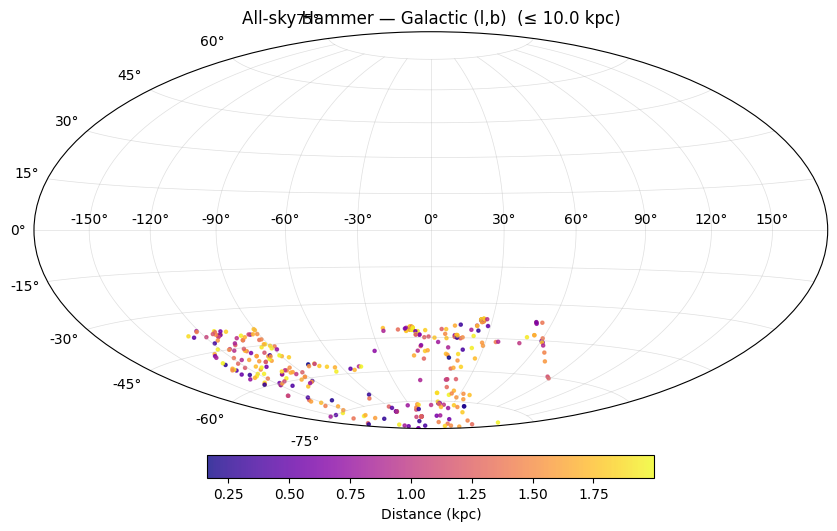

In [35]:
plot_sky_scatter(subset, max_dist_kpc=10.0, projection='hammer', color_by='distance', s=5, alpha=0.8)

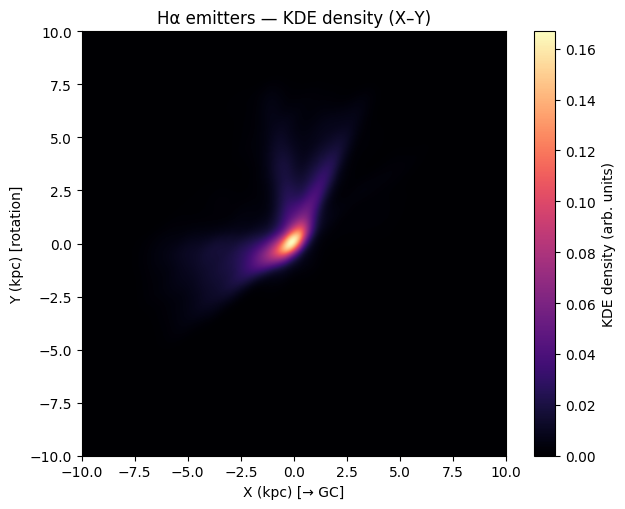

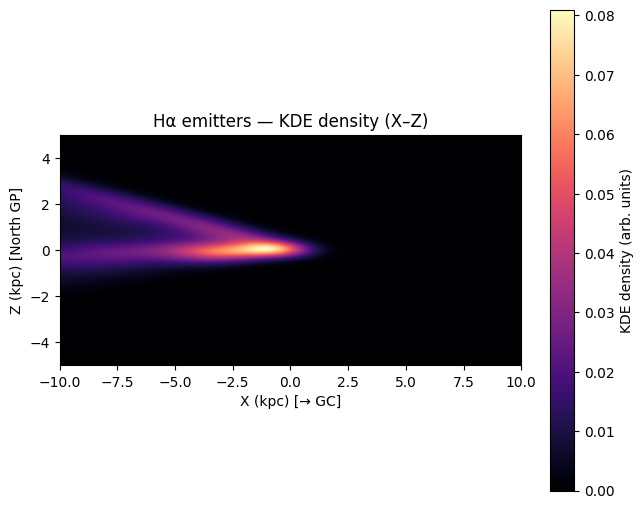

[warn] HDBSCAN unavailable (No module named 'hdbscan'). Falling back to DBSCAN.
[info] Clustering algorithm used: DBSCAN
[info] Found 80 clusters; noise points: 3977

Top clusters by size and elongation:
 cluster    n  center_x  center_y  center_z     var1     var2     var3  elongation
       0 8193  1.061608 -0.407756 -2.336204 0.637561 0.289418 0.073021    2.202907
       5   65 -2.091062 -3.162302 -3.450148 0.487286 0.436909 0.075804    1.115303
      10   43 -0.500735 -0.164858 -5.414090 0.798237 0.118486 0.083276    6.736954
       1   40 -0.867589 -2.586207 -5.568000 0.625486 0.264913 0.109601    2.361096
      50   39 -2.046649 -3.168763 -8.276592 0.730435 0.144435 0.125130    5.057202
       2   34 -0.332304 -4.964014 -5.444398 0.695191 0.232511 0.072298    2.989934
      28   31  5.227646  1.777408 -5.741748 0.614869 0.294968 0.090163    2.084526
      14   29 -1.214023 -3.905902 -4.789672 0.692376 0.182381 0.125243    3.796318
      41   27  3.727619  1.283970 -5.980377 0.705

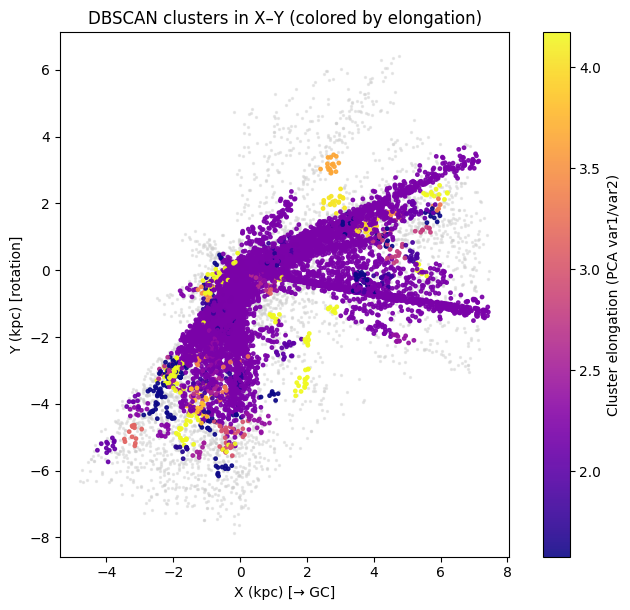

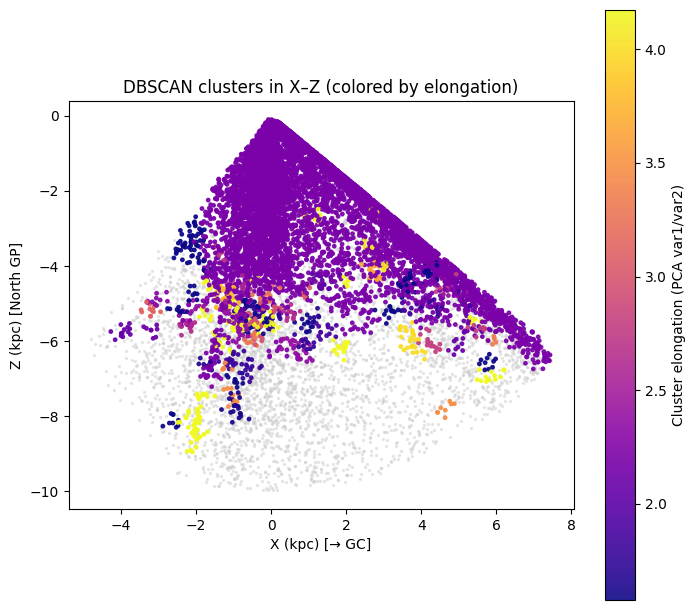


[info] Filament-candidates (elongation ≥ 2.0): [0, 10, 1, 50, 2, 28, 14, 41, 54, 48, 3, 12, 34, 53, 35, 51, 9, 61, 33, 76, 57, 25, 73, 31, 17, 13, 30, 19, 66, 59, 4, 47, 7, 60, 49, 68, 39, 77, 70, 20, 74, 79, 22, 71, 64, 36, 6, 62, 69, 67, 44]


{'index_valid': Index([    0,     1,     3,     4,     7,     8,    11,    12,    14,    15,
        ...
        26318, 26321, 26324, 26328, 26332, 26346, 26349, 26350, 26351, 26354],
       dtype='int64', length=13259),
 'x': array([0.28383239, 0.93967257, 1.04230363, ..., 0.24368506, 7.10558379,
        7.03754771]),
 'y': array([0.10495513, 0.36088452, 0.4578623 , ..., 0.07935765, 2.33067583,
        2.33000714]),
 'z': array([-1.73295782, -5.75203933, -6.20241107, ..., -0.20911987,
        -6.16959405, -6.05609273]),
 'labels': array([ 0, 37, 37, ...,  0, -1, -1]),
 'point_elongation': array([2.2029066 , 1.78227474, 1.78227474, ..., 2.2029066 ,        nan,
               nan]),
 'shape_df':     cluster     n  center_x  center_y  center_z      var1      var2      var3  \
 0         0  8193  1.061608 -0.407756 -2.336204  0.637561  0.289418  0.073021   
 5         5    65 -2.091062 -3.162302 -3.450148  0.487286  0.436909  0.075804   
 10       10    43 -0.500735 -0.164858 -5.414090  0

In [37]:
analyze_filaments(final,
                            max_dist_kpc=10.0,
                            draw_kde=True,
                            elongation_threshold=2.0)